For notebook used to estimate numbers for March 2020 CSR, refer to notebooks in the TenantNPS Directory.

The objective of this notebook is to run Uplift on RBC Admin one final time, now including data from March.

In [2]:
import os
import csv
import math
import pandas as pd
import numpy as np
import datetime
import xlwt
import glob
import pyexcel as p
import matplotlib.pyplot as plt
import seaborn as sns
import json

Key Terms:

* Theme Share: Of all Verbatims, how many of them belong to a given theme? Expressed as a percentage.

* Bottom Box Ratio: Of all Verbatims with this Theme, how many of them are from detractors? Also expressed as a percentage.

* Uplift: How would improving toxic Themes (those with higher BBR) potentially affect NPS?

In [29]:
admin_df = pd.read_csv('AdminSentimentDataApril2020.csv')

In [30]:
admin_df['Feedback_DateTime'] = pd.to_datetime(admin_df['Feedback_DateTime'])
admin_df['month_year'] = admin_df.Feedback_DateTime.dt.to_period('M')

In [31]:
admin_df.head()

,Feedback_ID,Feedback_DateTime,Feedback_Month,Feedback_App,Feedback_Rating,Feedback_RatingValue,Feedback_Verbatim,Verbatim_Themes,Verbatim_Details,month_year
0,254a9a54-49cb-4f6e-bf14-b6ca97c9e6f0,2020-04-04 12:14:56,2020-04-30,M365 Admin Center,4,0,NaN,NaN,NaN,2020-04
1,f7e3df7d-5b1f-4bc7-af56-91a0e60e3b2d,2020-04-04 12:13:36,2020-04-30,M365 Admin Center,4,0,Expensive to maintain.,"[""subscription value""]","[""{\""FeedbackSentencesId\"": 9232530,\""Sentence...",2020-04
2,266f1ac1-99a1-4415-81a0-3784e71bccbe,2020-04-04 12:10:10,2020-04-30,M365 Admin Center,5,100,NaN,NaN,NaN,2020-04
3,bc56aeb2-decb-49e9-b695-cdf5376b900f,2020-04-04 12:07:59,2020-04-30,M365 Admin Center,5,100,NaN,NaN,NaN,2020-04
4,53352690-524f-4005-9bfc-7305397a0903,2020-04-04 12:05:27,2020-04-30,M365 Admin Center,3,-100,NaN,NaN,NaN,2020-04


In [32]:
admin_df = admin_df[admin_df.month_year>='2018-06']
admin_df = admin_df[admin_df.month_year<admin_df.month_year.max()]

In [33]:
def find_between( s, first, last ):
    try:
        start = s.index( first ) + len( first )
        end = s.index( last, start )
        return s[start:end]
    except ValueError:
        return ""
    
Verbatim_Details = admin_df.Verbatim_Details[admin_df.Verbatim_Details.notnull()]
details_dict = {}
for V, ix in zip(Verbatim_Details, Verbatim_Details.index):
    #Verbatim_Sample = Verbatim_Details.iloc[0]
    j = json.loads(V)
    themes = []

    for S in j:
        S = S.split(',')
        for AT in [item for item in S if item.find('AdminTheme')!=-1]:
            theme = find_between(AT,'["','"]')
            themes.append(theme)
    details_dict[ix] = ','.join(list(set(themes)))

details = pd.Series(details_dict)    

details.fillna('',inplace=True)
details = details.str.replace('not mapped','')
details = details.str.replace('other','')
details = details.replace('no theme','')
details = details.str.strip(',')

i = 1
while sum(details.str.contains(',,'))>0:
    print('Time ',i)
    print('From ',sum(details.str.contains(',,')))
    details = details.str.replace(',,',',')
    print('To ',sum(details.str.contains(',,')))
    i+=1

details.replace('','no theme',inplace=True)

details = details.str.split(',').apply(set).apply(list)
details = details.astype(str).str.strip('[]')
details = details.str.replace(" '","'")
details = details.str.replace("'","")
admin_df['Verbatim_DetailsThemes'] = admin_df.index.map(details)

Time  1
From  63
To  0


In [34]:
verbatim_df = admin_df[admin_df.Feedback_Verbatim.notnull()]

# Rule Based Classifier Themes: Share and BBR 

In [65]:
admin_df['Verbatim_Themes'] = admin_df['Verbatim_Themes'].str.strip('[]*"')
admin_df['Verbatim_Themes'] = admin_df['Verbatim_Themes'].str.replace('","',',')
admin_df['Verbatim_Themes'].replace('not mapped','no theme',inplace=True)

In [103]:
list_col = verbatim_df['Verbatim_Themes'].dropna().drop_duplicates().str.split(',')

merged_list = []
for item in list_col:
    merged_list.extend(item)
topics = sorted(list(set(merged_list)))
topics

for i, item in enumerate(topics):
    new_col_name = item#.upper()
    verbatim_df[new_col_name] = verbatim_df['Verbatim_Themes'].str.contains(item)*1



topic_df = verbatim_df.loc[:,topics].dropna().transpose()
topic_df['ThemeTotal'] = topic_df.sum(axis=1)
verbatim_total = verbatim_df.shape[0]
topic_df['ThemeShare'] = topic_df['ThemeTotal'].divide(verbatim_total).round(3)
bbr_dict = {}
for t in topics:
    #print(t)
    theme_df = verbatim_df[verbatim_df[t]==1]
    #print(theme_df.Feedback_Rating.value_counts())
    if len(theme_df) != 0:
        bbr = len(theme_df[theme_df.Feedback_Rating.isin([1,2,3])])/len(theme_df)
    else:
        bbr = 0
    bbr_dict[t] = round(bbr,3)

bbr_df = pd.DataFrame(index = bbr_dict.keys(),columns=['BBR'],data = bbr_dict.values())
bbr_df

final_df = pd.concat([topic_df,bbr_df],axis=1).iloc[:,-3:]

final_df

C:\Users\v-Jaand\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,ThemeTotal,ThemeShare,BBR
access,1119.0,0.019,0.573
account,3350.0,0.057,0.644
admin,6928.0,0.118,0.653
authentication,1428.0,0.024,0.887
azure ad,1423.0,0.024,0.514
bugs,462.0,0.008,0.853
calendar,3.0,0.000,0.333
change management,1897.0,0.032,0.723
compete,1258.0,0.021,0.759
dynamics crm,97.0,0.002,0.577


In [129]:
themes_to_trend = final_df[final_df.ThemeTotal>=250]

In [150]:
monthly_nps = {}
monthly_npsmoe = {}
for ttt in themes_to_trend.index:
    sub_df = verbatim_df[verbatim_df[ttt]==1]
    monthly_nps[ttt] = sub_df.groupby(['month_year'])['Feedback_RatingValue'].mean().round(2)
    monthly_npsmoe[ttt] = sub_df.groupby(['month_year'])['Feedback_RatingValue'].std().round(2)/\
    sub_df.groupby(['month_year'])['Feedback_RatingValue'].count().round(2)**0.5

In [151]:
MoM_npsRBC = pd.concat([monthly_nps[ttt] for ttt in themes_to_trend.index],axis=1)


In [152]:
MoM_nps.columns =list(themes_to_trend.index)

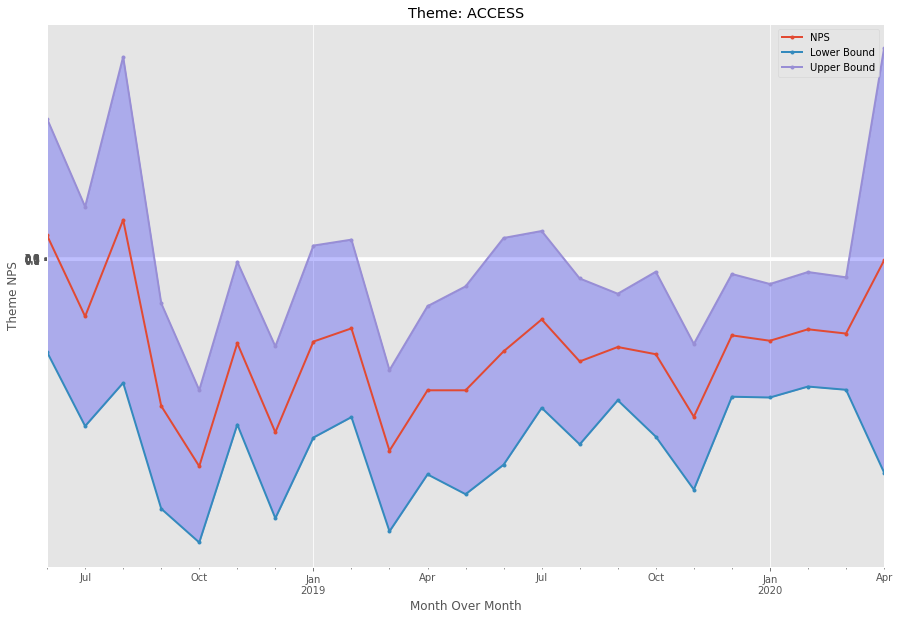

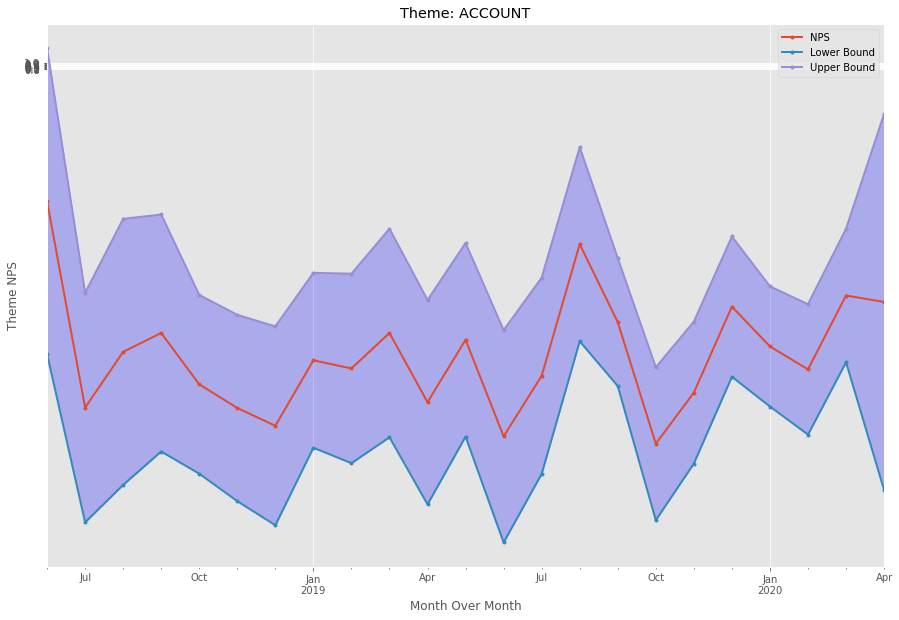

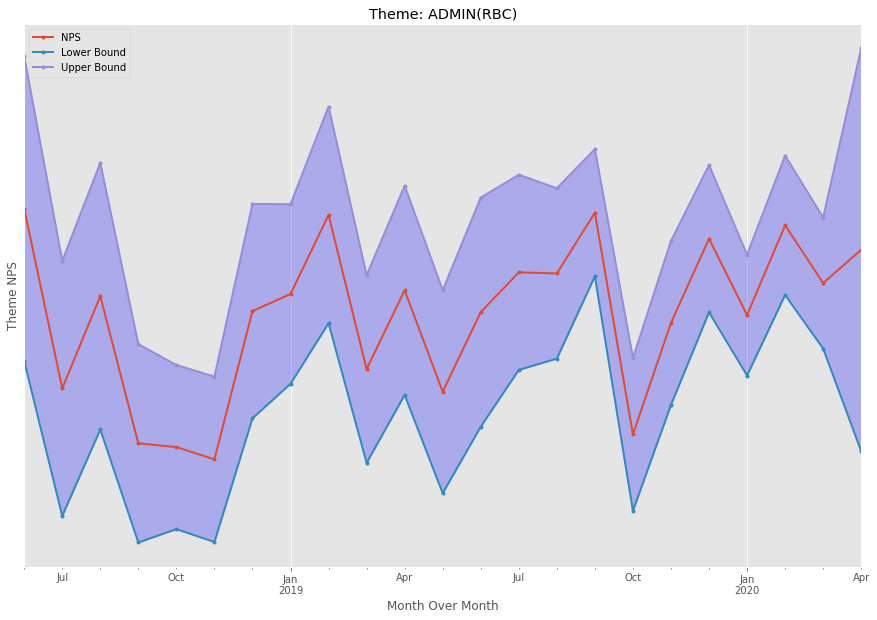

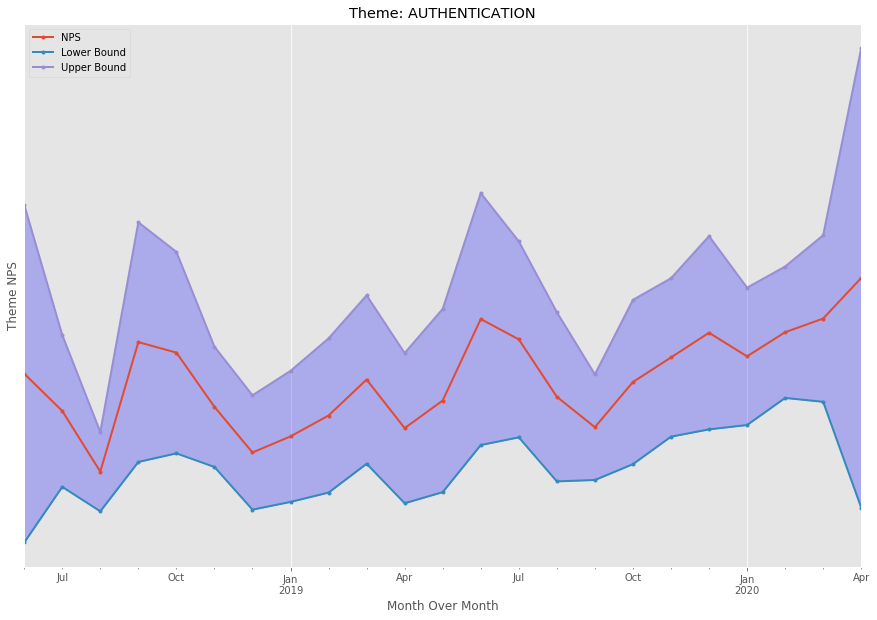

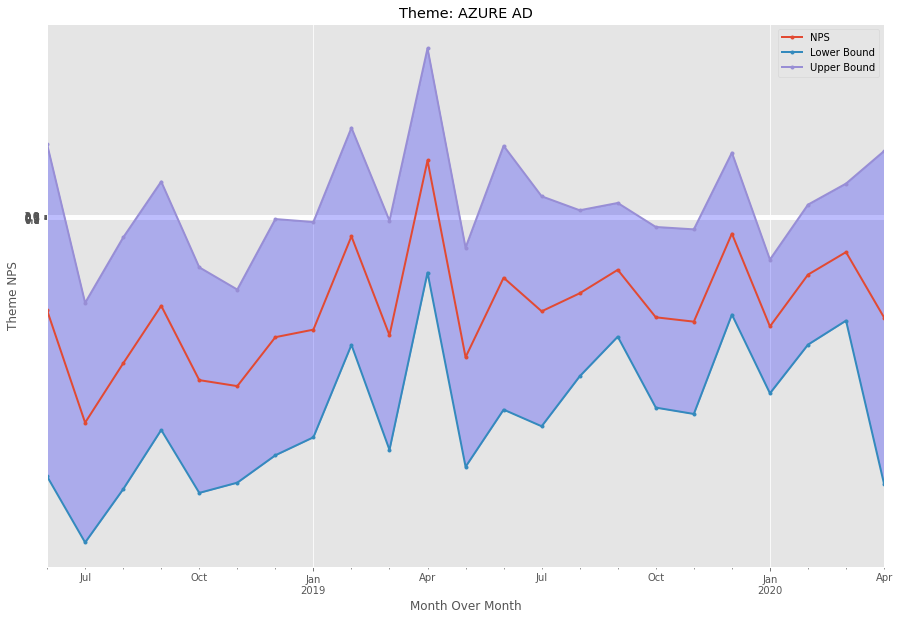

...

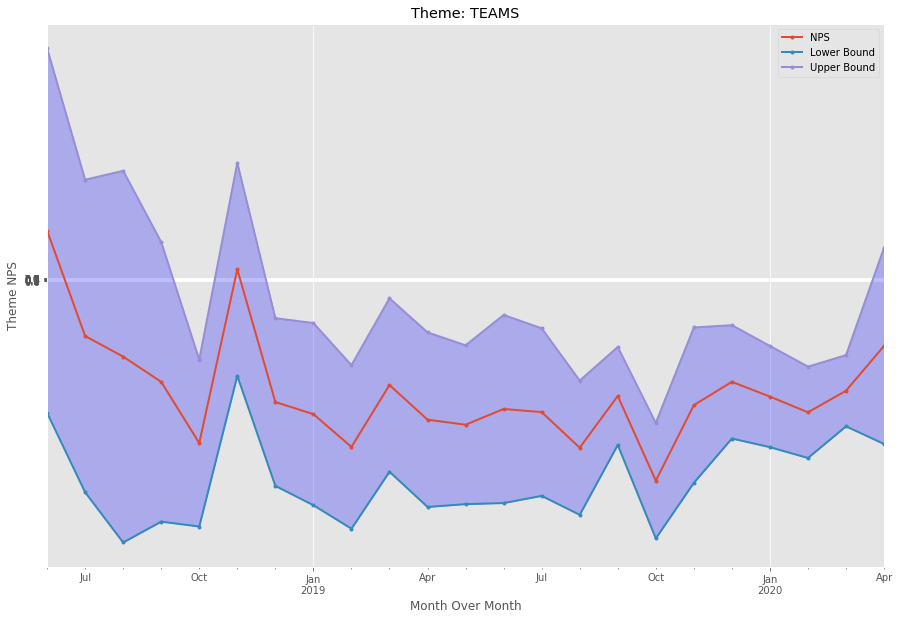

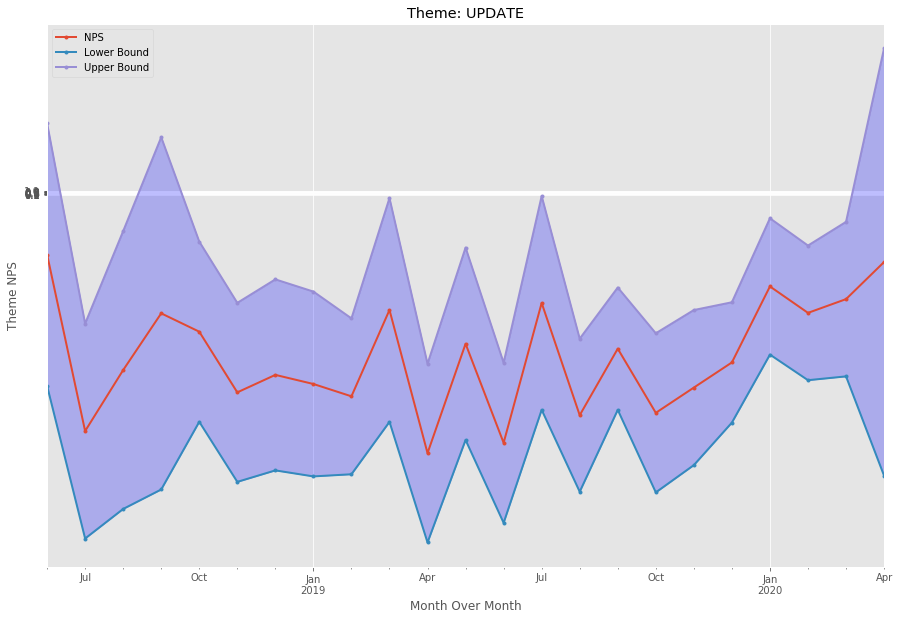

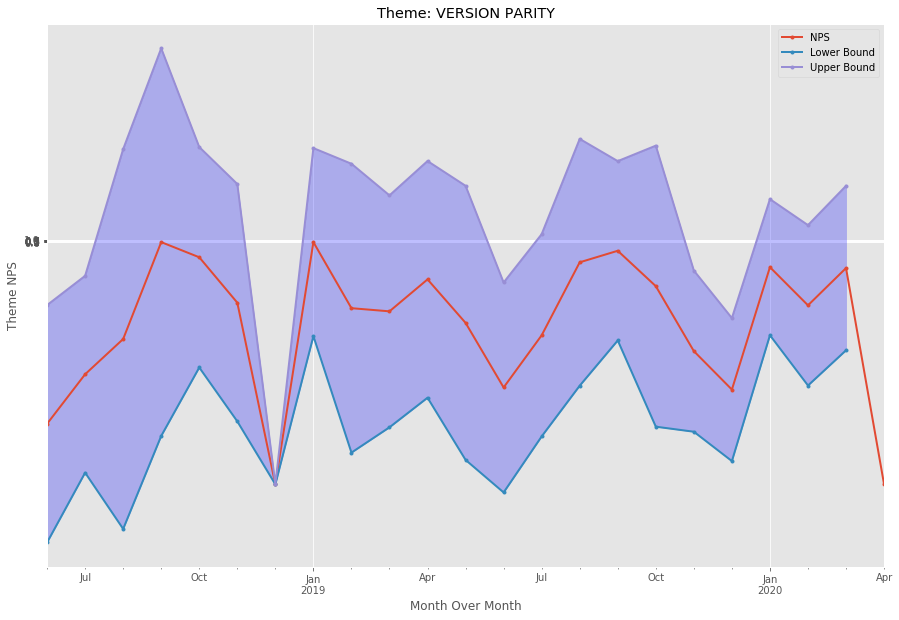

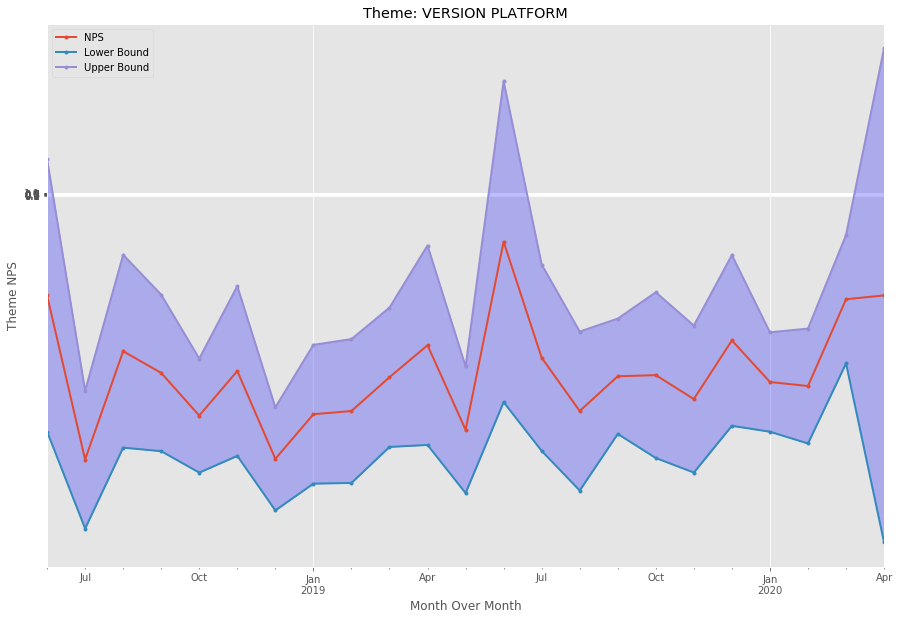

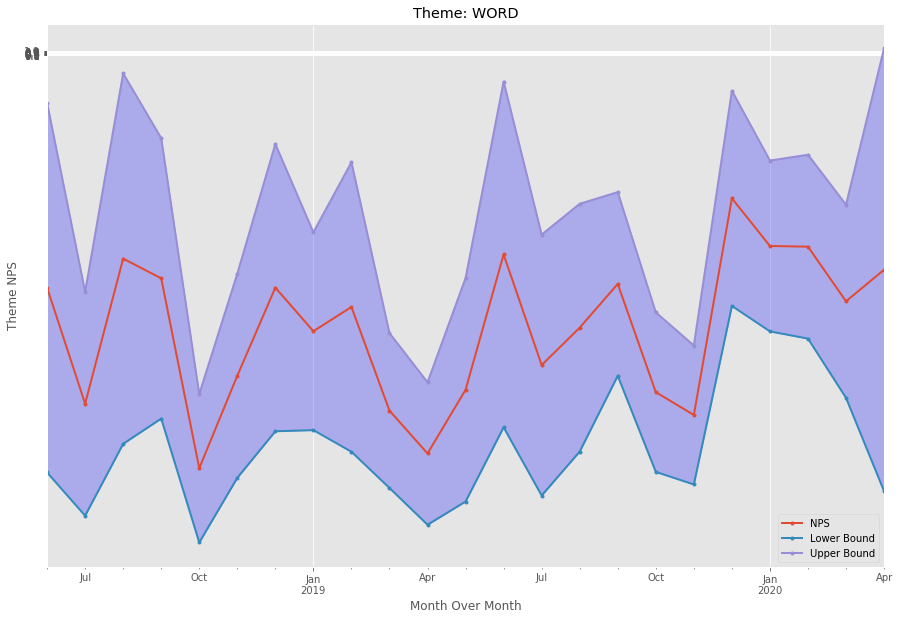

In [155]:
for col in MoM_nps.columns:
    plot_df = pd.DataFrame(index=['NPS','MoE'],data=[MoM_nps[col],monthly_npsmoe[col]]).T#.reset_index()
    plot_df['Lower Bound'] = plot_df['NPS'] - 1.96*plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['NPS'] + 1.96*plot_df['MoE']
    if col == 'admin':
        col += '(RBC)'
    ax = plot_df.plot(y=['NPS','Lower Bound','Upper Bound'],grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('Theme NPS')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, color='blue',alpha=0.25)

In [68]:
MoM_all = verbatim_df.groupby(['month_year'])[themes_to_trend.index].sum()
monthly_totals = verbatim_df.month_year.value_counts().sort_index()
MoM_share = MoM_all.copy()
for col in MoM_share:
    MoM_share.loc[:,col] =MoM_share.loc[:,col]/monthly_totals 

In [69]:
#eou*
#outlook
#support
#subscription value
#account

C:\Users\v-Jaand\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


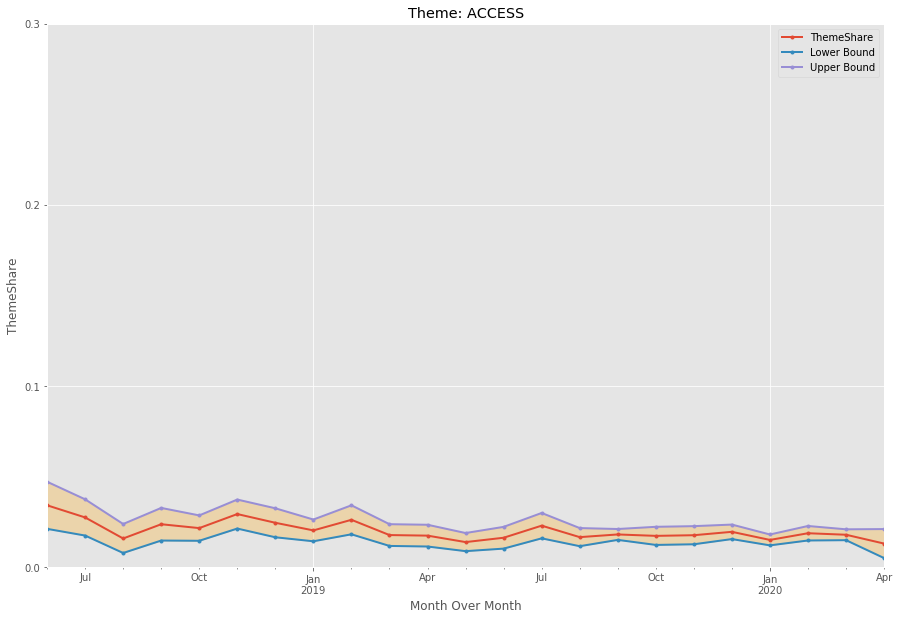

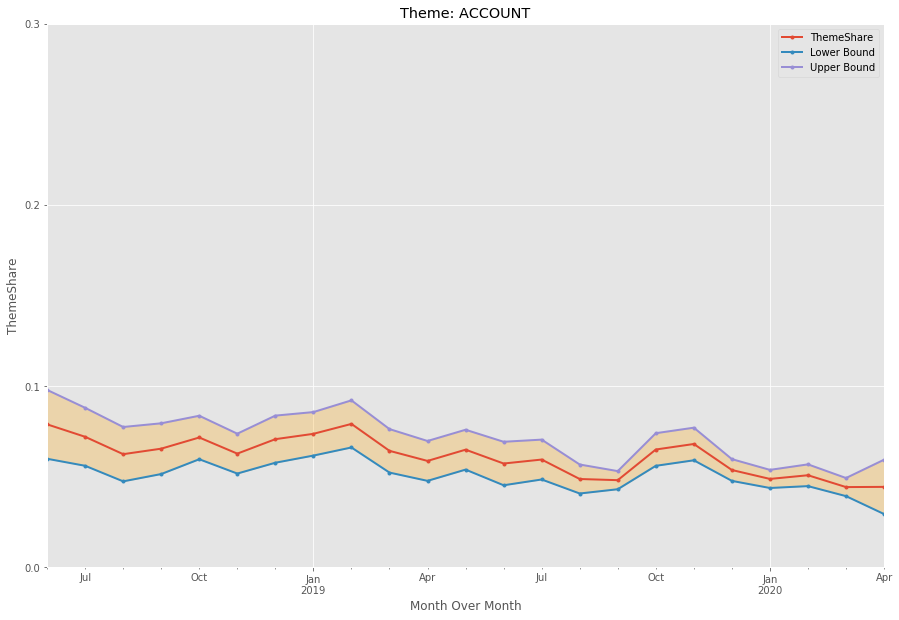

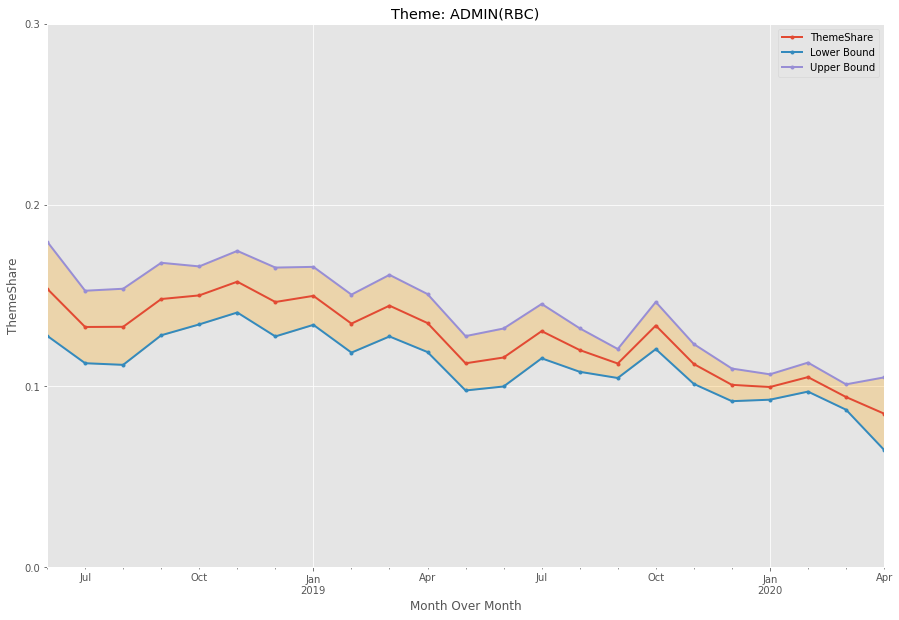

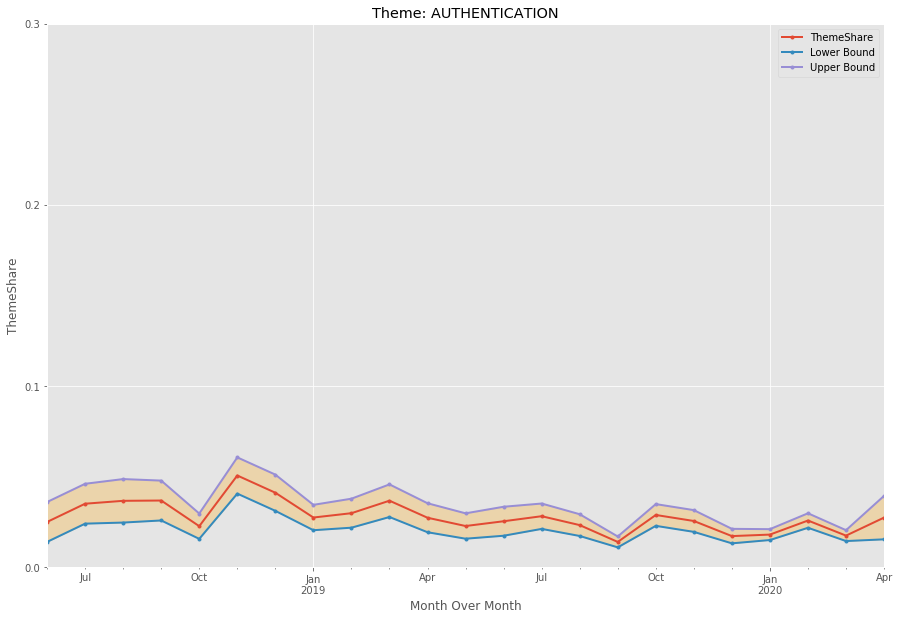

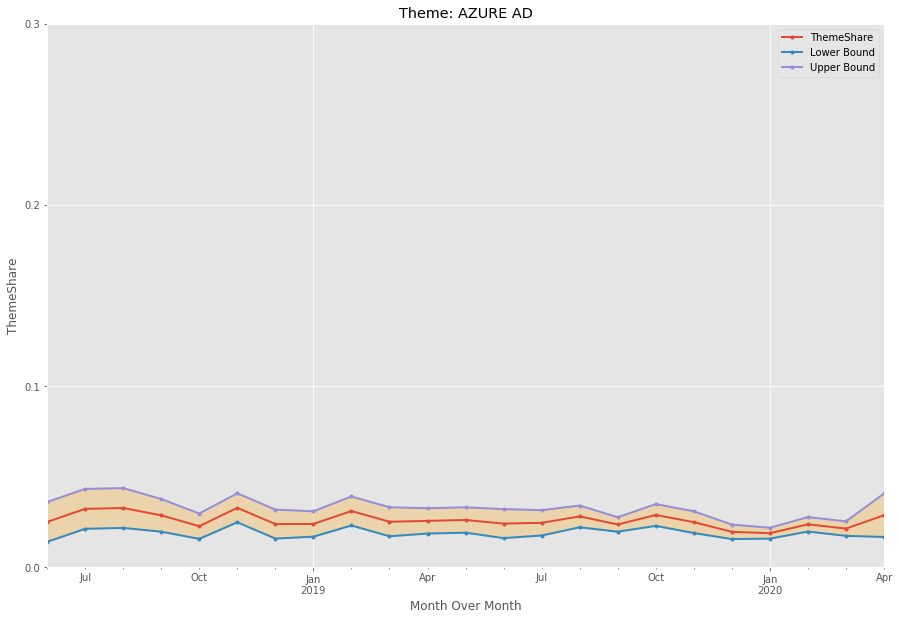

...

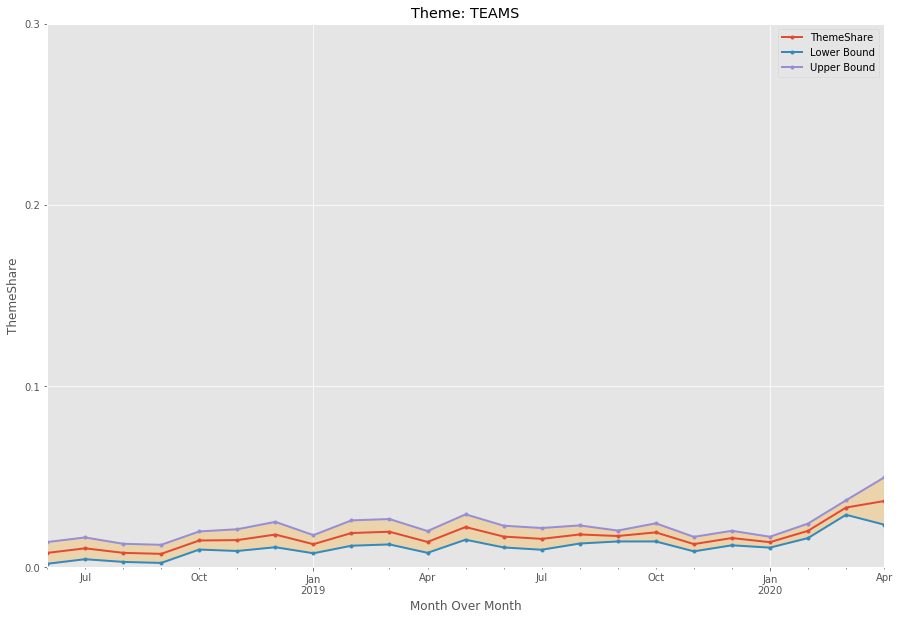

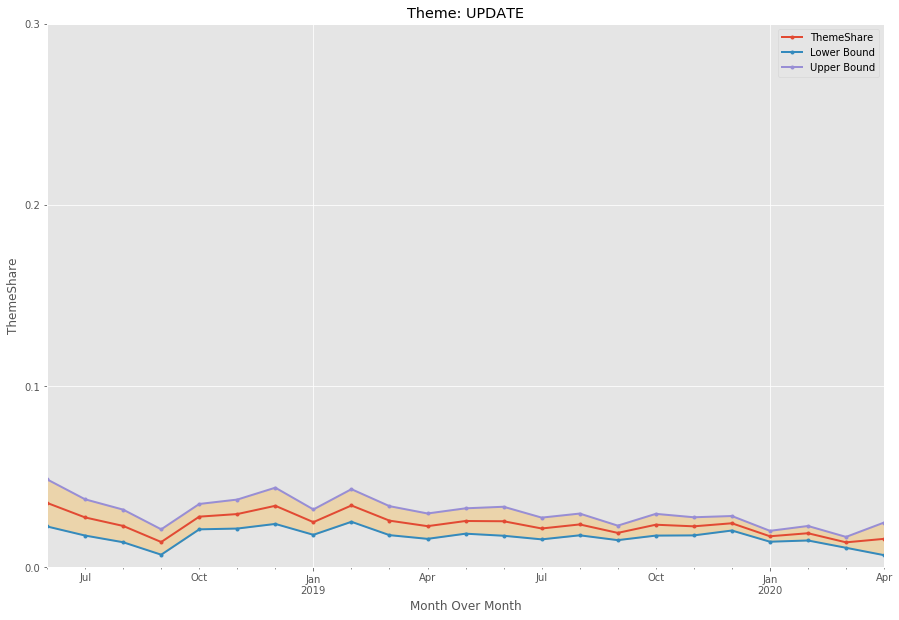

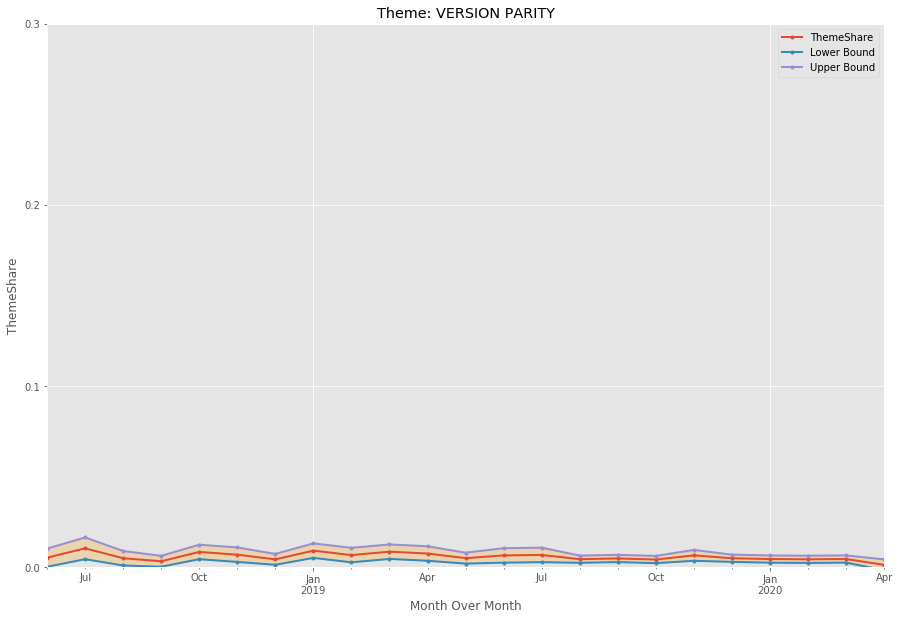

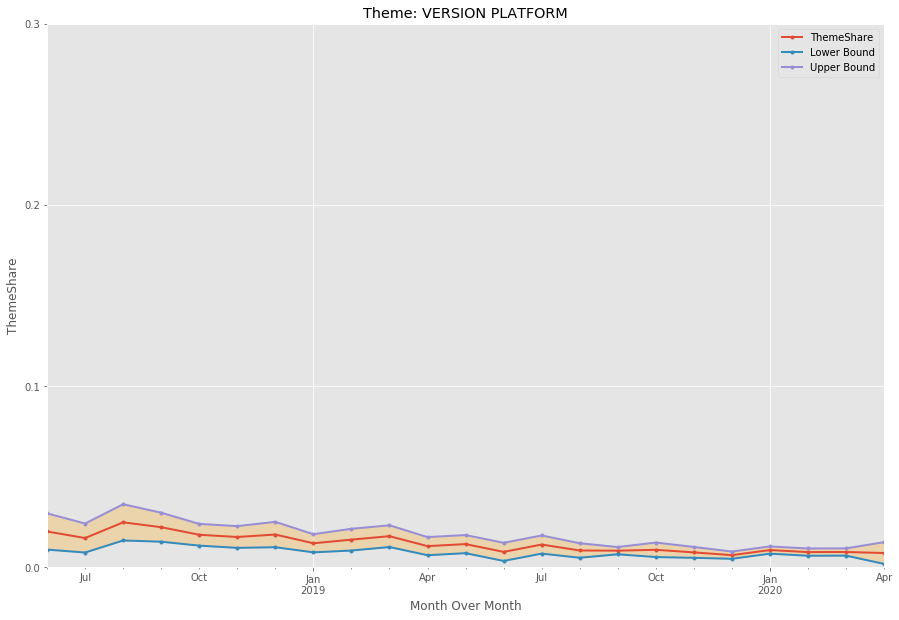

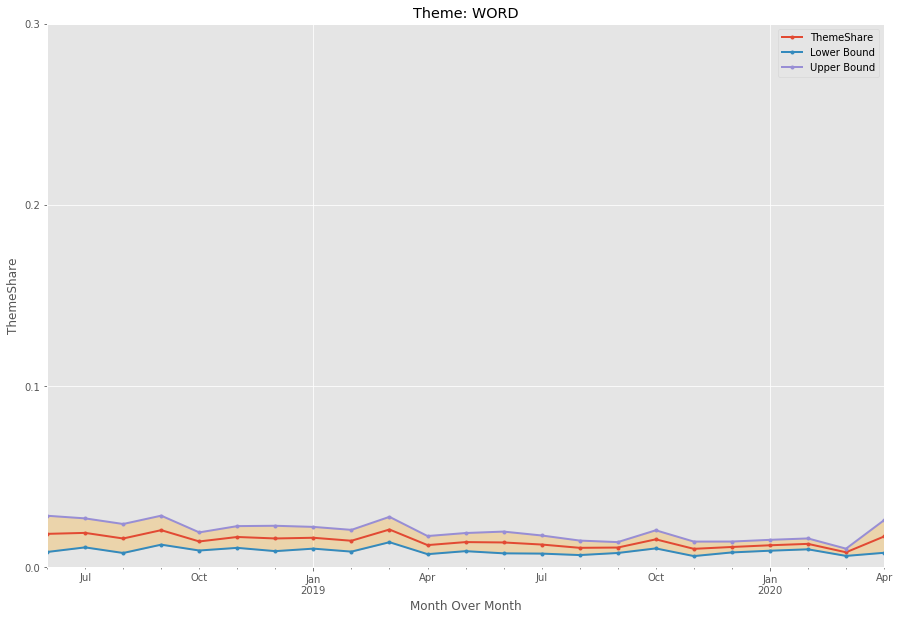

In [70]:
plt.style.use('ggplot')
for col in MoM_share.columns:
    plot_df = pd.DataFrame(index=['ThemeShare','N'],data=[MoM_share[col],monthly_totals]).T#.reset_index()
    plot_df['MoE'] = ((plot_df['ThemeShare']*(1-plot_df['ThemeShare'])/plot_df['N'])**0.5)*1.96
    plot_df['MoE'] = plot_df['MoE'].round(3)
    plot_df['Lower Bound'] = plot_df['ThemeShare'] - plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['ThemeShare'] + plot_df['MoE']
    if col == 'admin':
        col += '(RBC)'
    ax = plot_df.plot(y=['ThemeShare','Lower Bound','Upper Bound'],grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),ylim=(0,0.3),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('ThemeShare')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, color='orange',alpha=0.25)

In [71]:
MoM_det = verbatim_df[verbatim_df.Feedback_Rating.isin([1,2,3])].groupby(['month_year'])[themes_to_trend.index].sum()
MoM_BBR = MoM_det.divide(MoM_all).round(3)

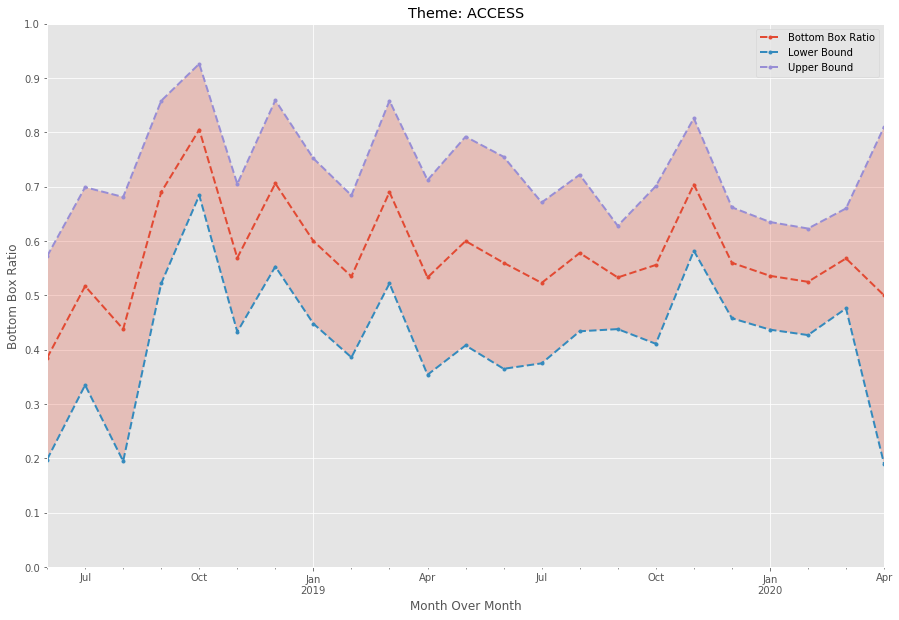

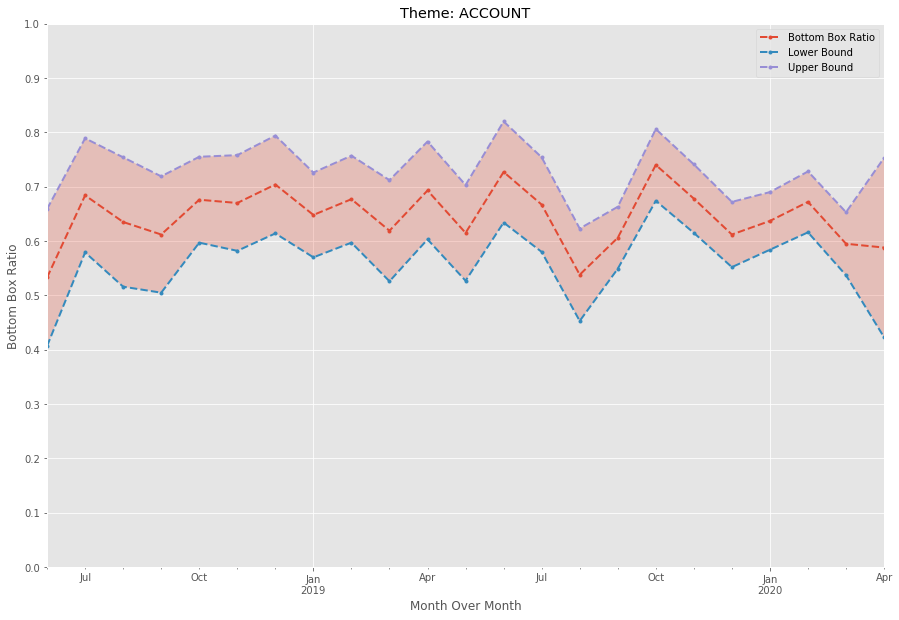

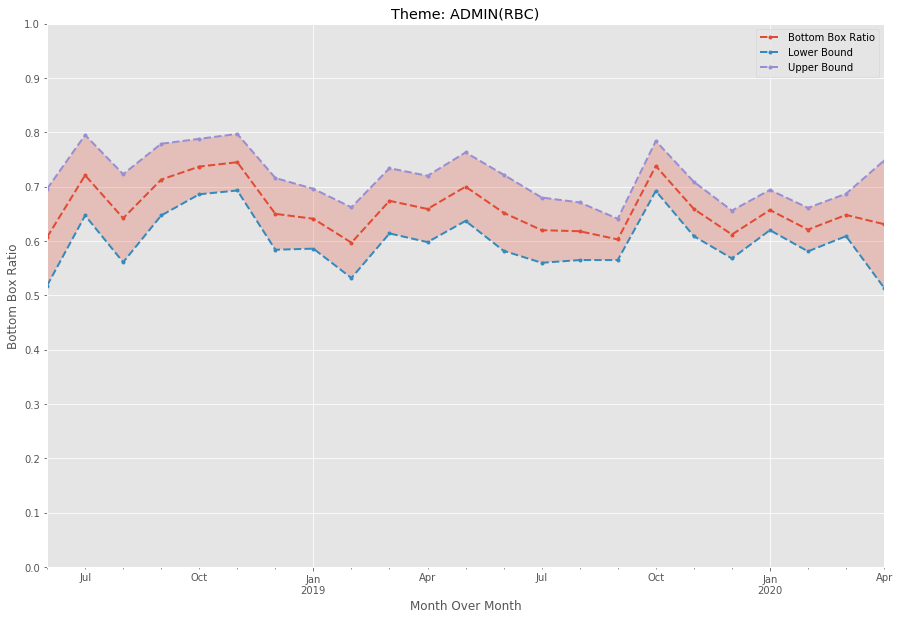

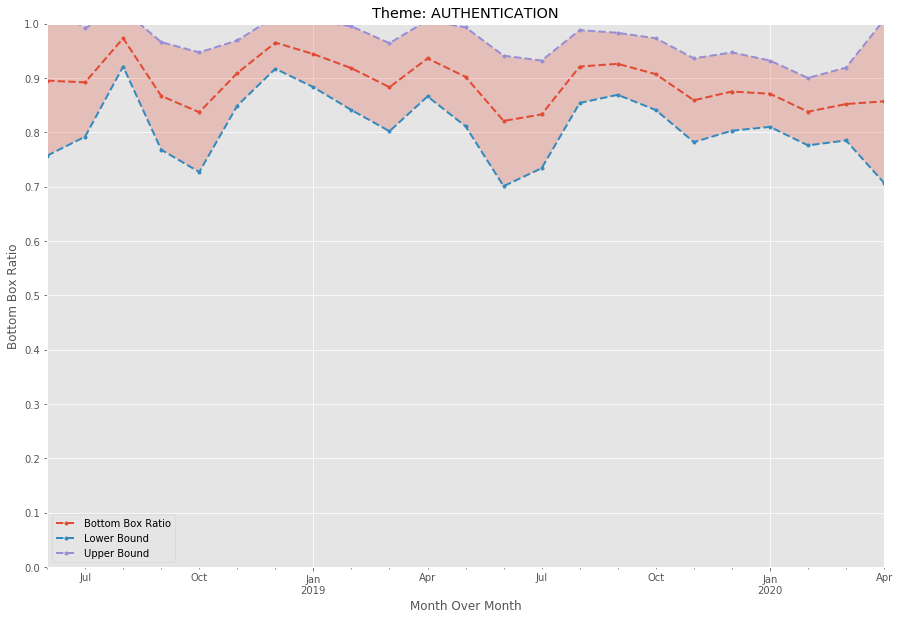

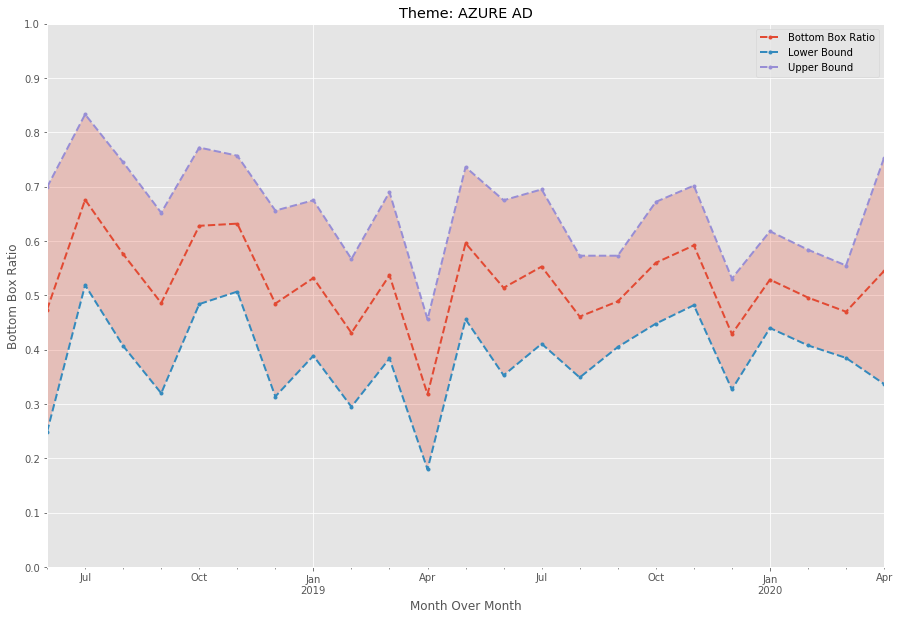

...

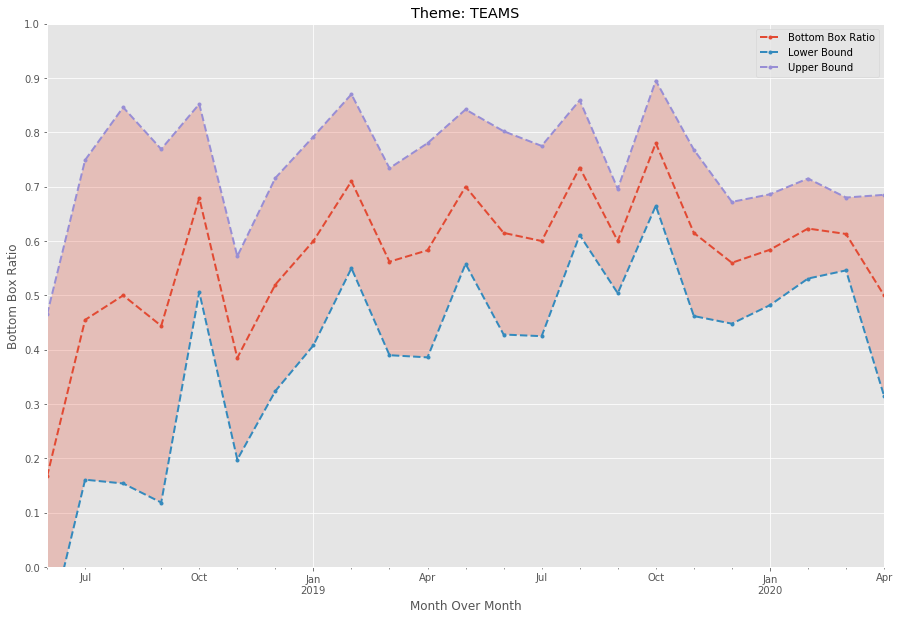

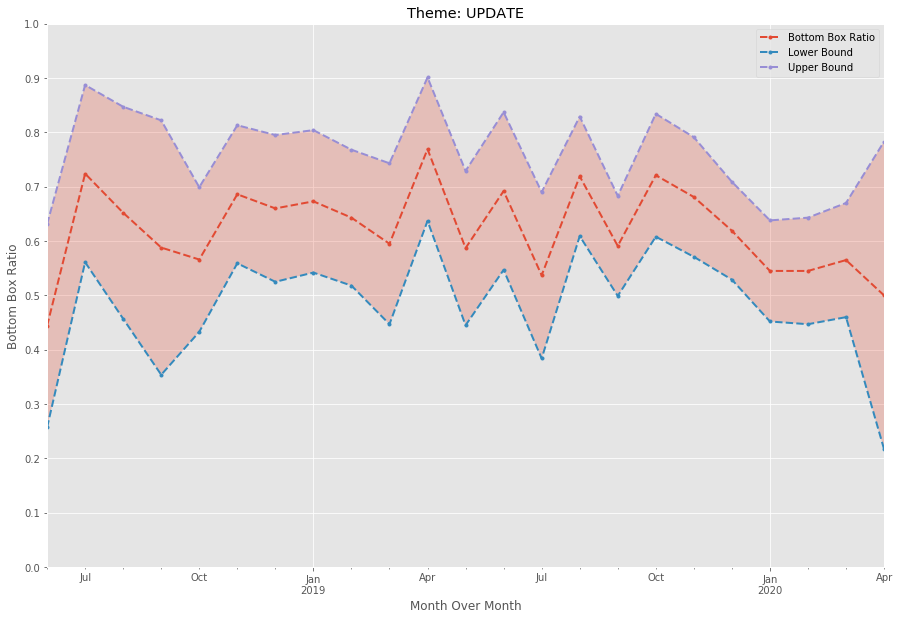

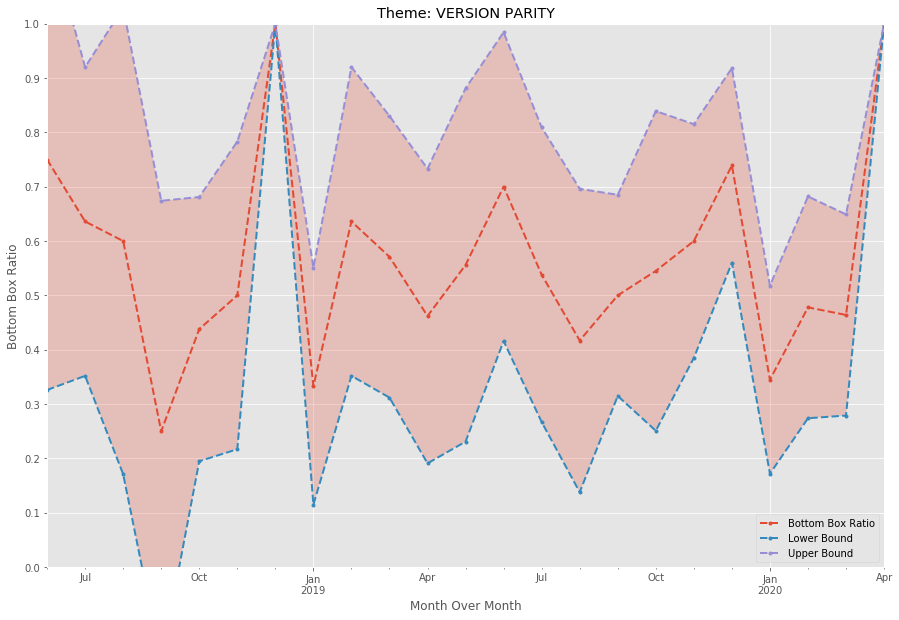

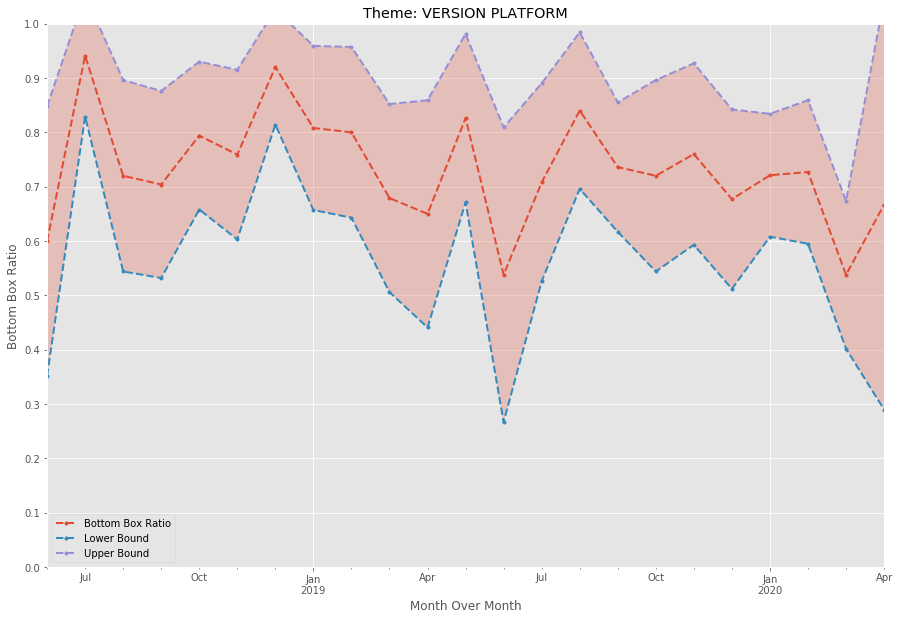

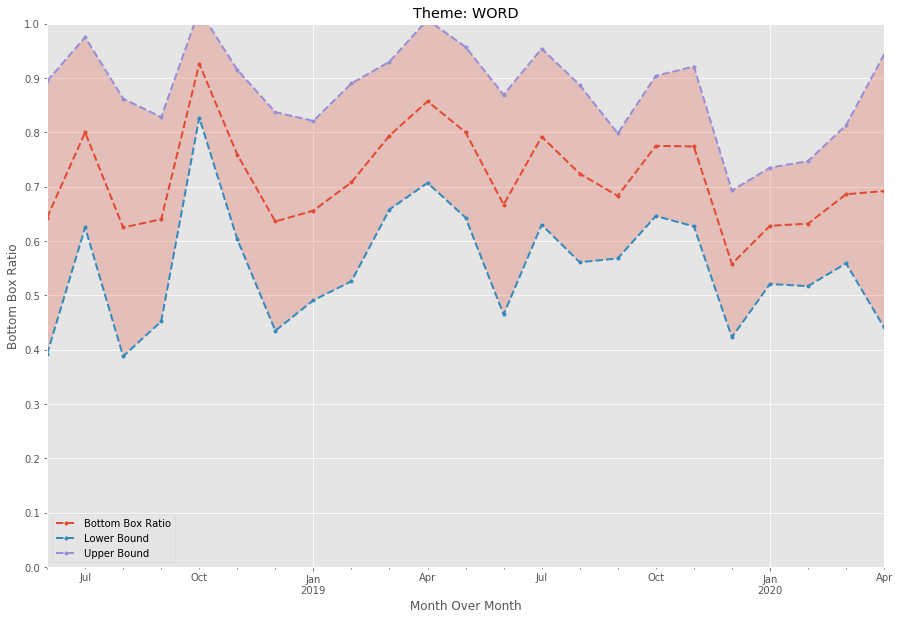

In [72]:
for col in MoM_BBR.columns:
    plot_df = pd.DataFrame(index=['Bottom Box Ratio','N'],data=[MoM_BBR[col],MoM_all[col]]).T#.reset_index()
    plot_df['MoE'] = ((plot_df['Bottom Box Ratio']*(1-plot_df['Bottom Box Ratio'])/plot_df['N'])**0.5)*1.96
    plot_df['MoE'] = plot_df['MoE'].round(3)
    plot_df['Lower Bound'] = plot_df['Bottom Box Ratio'] - plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['Bottom Box Ratio'] + plot_df['MoE']
    if col == 'admin':
        col += '(RBC)'
    ax = plot_df.plot(y=['Bottom Box Ratio','Lower Bound','Upper Bound'],style='--',grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),ylim=(0,1),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('Bottom Box Ratio')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, alpha=0.25)

# ML Classified Themes: Theme Share and Bottom Box Ratio

In [73]:
list_col = verbatim_df['Verbatim_DetailsThemes'].dropna().drop_duplicates().str.split(',')

merged_list = []
for item in list_col:
    merged_list.extend(item)
topics = sorted(list(set(merged_list)))
topics

for i, item in enumerate(topics):
    new_col_name = item#.upper()
    verbatim_df[new_col_name] = verbatim_df['Verbatim_DetailsThemes'].str.contains(item)*1



topic_df = verbatim_df.loc[:,topics].dropna().transpose()
topic_df['ThemeTotal'] = topic_df.sum(axis=1)
verbatim_total = verbatim_df.shape[0]
topic_df['ThemeShare'] = topic_df['ThemeTotal'].divide(verbatim_total).round(3)
bbr_dict = {}
for t in topics:
    #print(t)
    theme_df = verbatim_df[verbatim_df[t]==1]
    #print(theme_df.Feedback_Rating.value_counts())
    if len(theme_df) != 0:
        bbr = len(theme_df[theme_df.Feedback_Rating.isin([1,2,3])])/len(theme_df)
    else:
        bbr = 0
    bbr_dict[t] = round(bbr,3)

bbr_df = pd.DataFrame(index = bbr_dict.keys(),columns=['BBR'],data = bbr_dict.values())
bbr_df

final_df = pd.concat([topic_df,bbr_df],axis=1).iloc[:,-3:]

final_df

C:\Users\v-Jaand\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,ThemeTotal,ThemeShare,BBR
admin,3671.0,0.062,0.713
commerce,1192.0,0.020,0.819
customer support,2457.0,0.042,0.608
exchange,433.0,0.007,0.557
marketing,2331.0,0.040,0.576
mobile,312.0,0.005,0.590
no theme,46366.0,0.788,0.455
office client,542.0,0.009,0.708
onedrive,699.0,0.012,0.608
outlook,1352.0,0.023,0.768


In [74]:
themes_to_trend = final_df[final_df.ThemeTotal>=250]

In [150]:
monthly_nps = {}
monthly_npsmoe = {}
for ttt in themes_to_trend.index:
    sub_df = verbatim_df[verbatim_df[ttt]==1]
    monthly_nps[ttt] = sub_df.groupby(['month_year'])['Feedback_RatingValue'].mean().round(2)
    monthly_npsmoe[ttt] = sub_df.groupby(['month_year'])['Feedback_RatingValue'].std().round(2)/\
    sub_df.groupby(['month_year'])['Feedback_RatingValue'].count().round(2)**0.5

In [151]:
MoM_npsML = pd.concat([monthly_nps[ttt] for ttt in themes_to_trend.index],axis=1)


In [152]:
MoM_nps.columns =list(themes_to_trend.index)

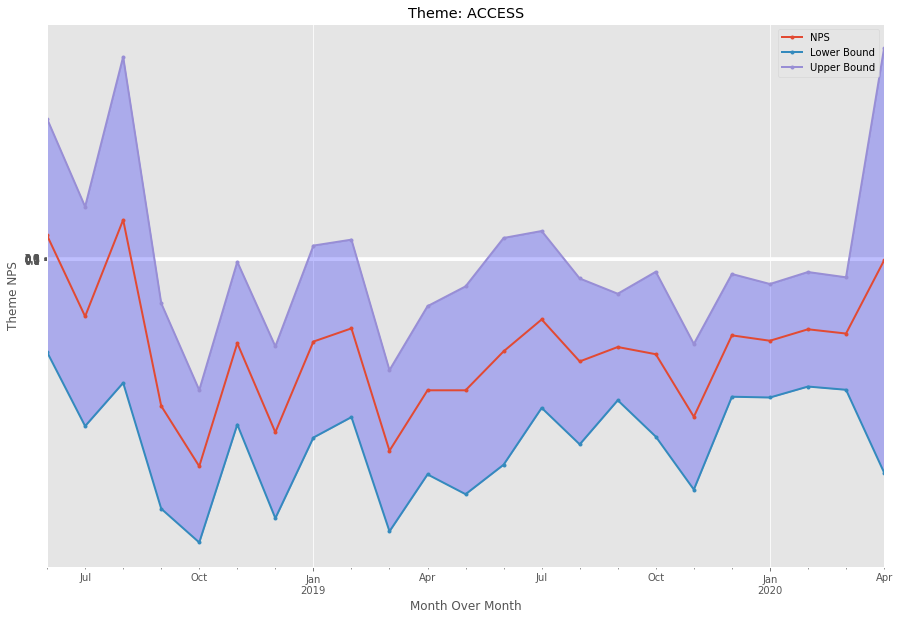

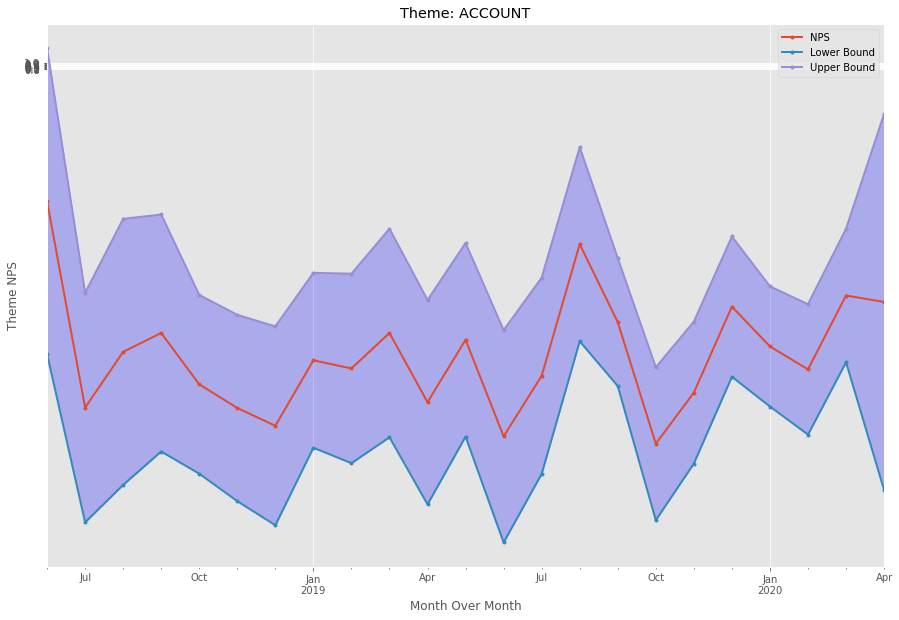

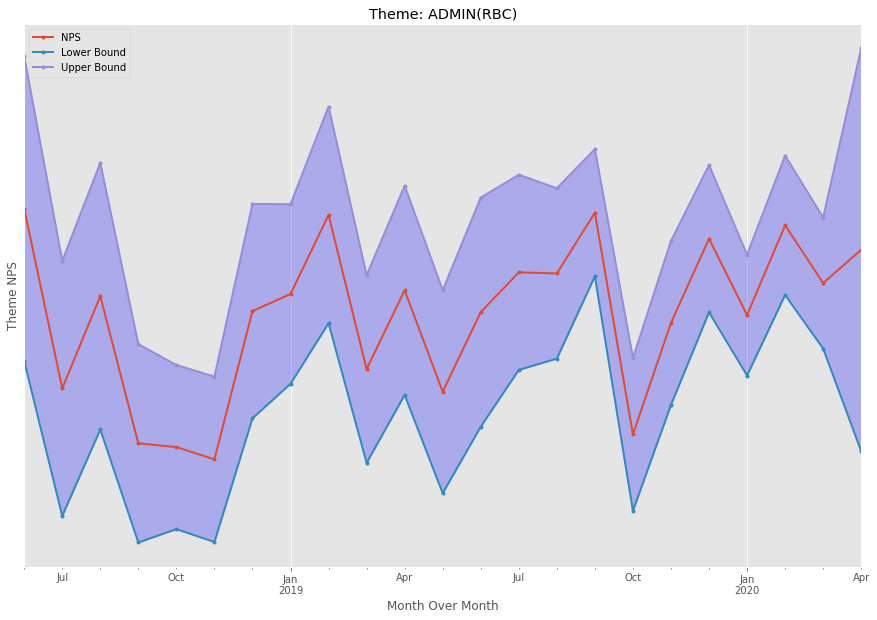

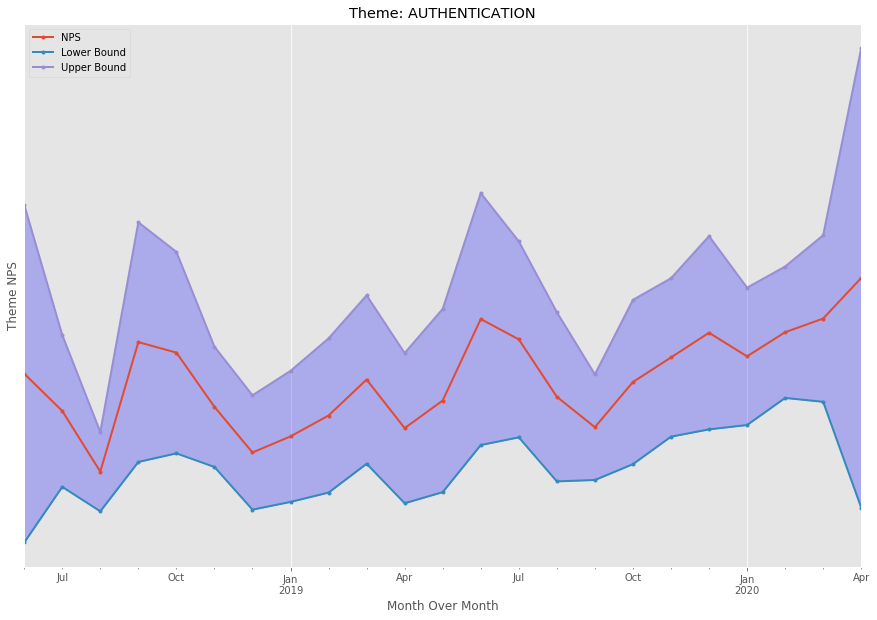

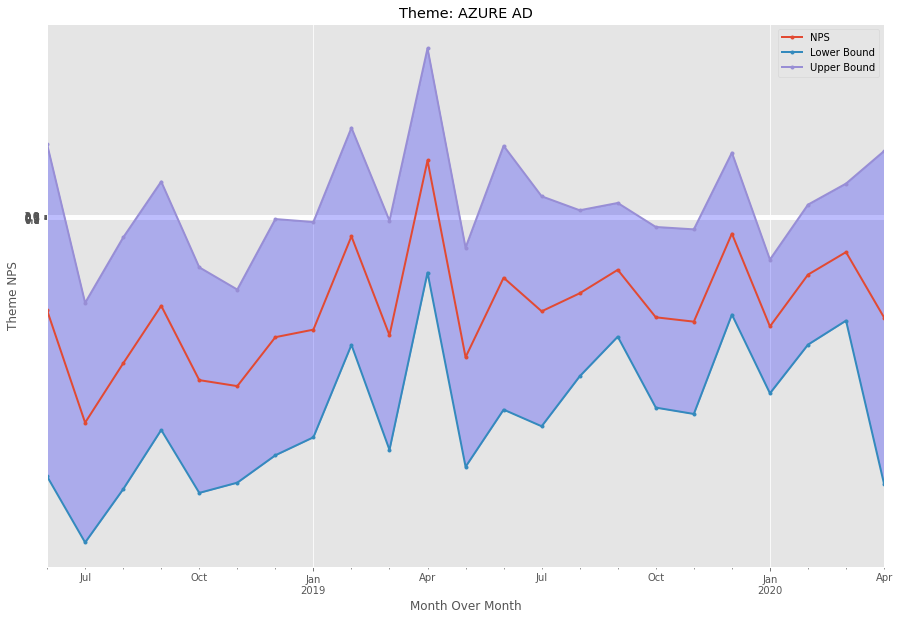

...

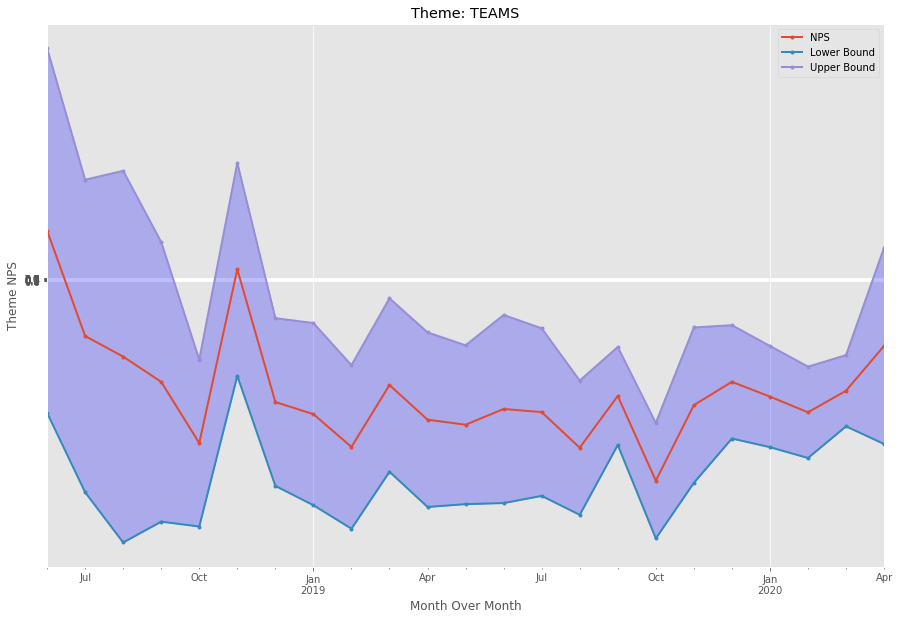

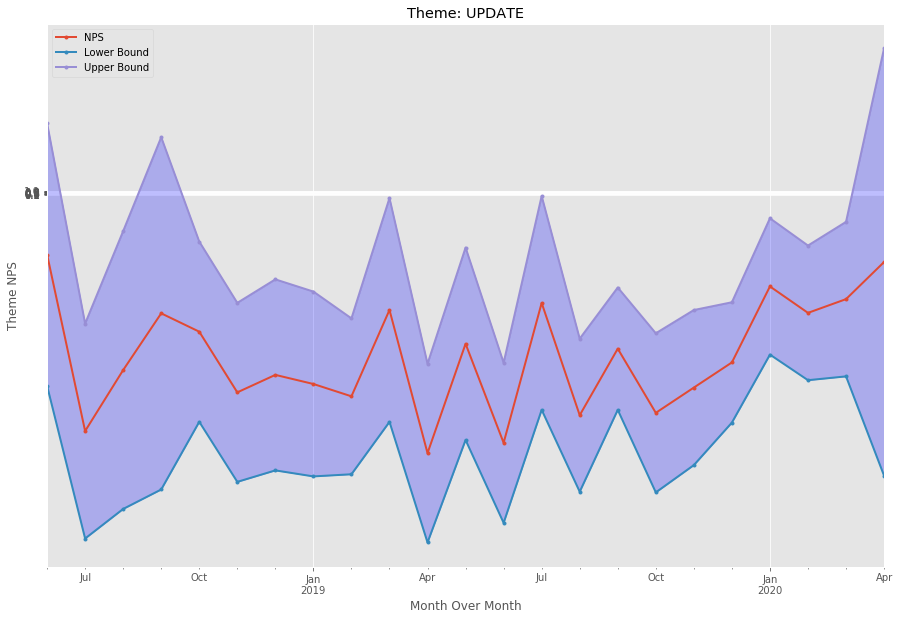

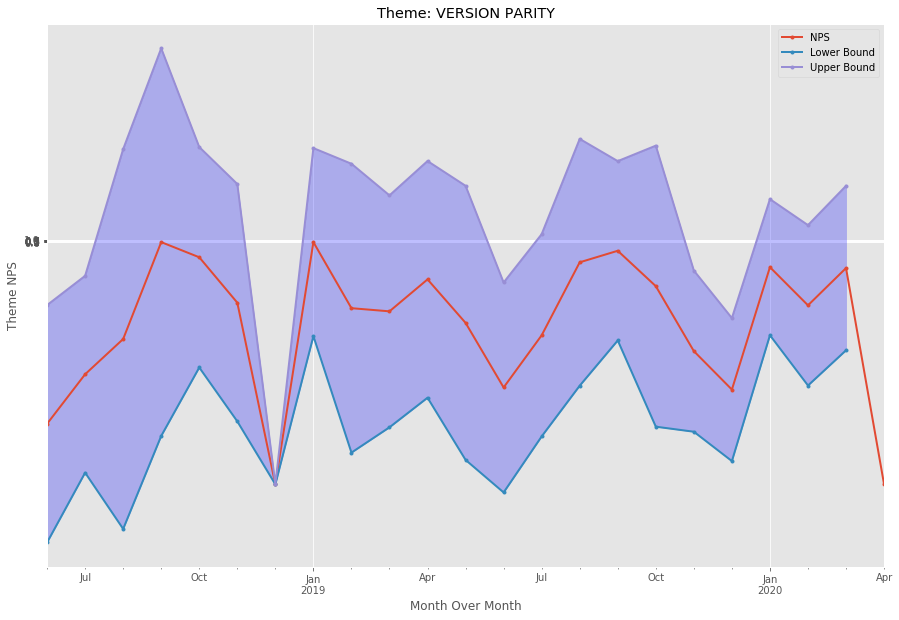

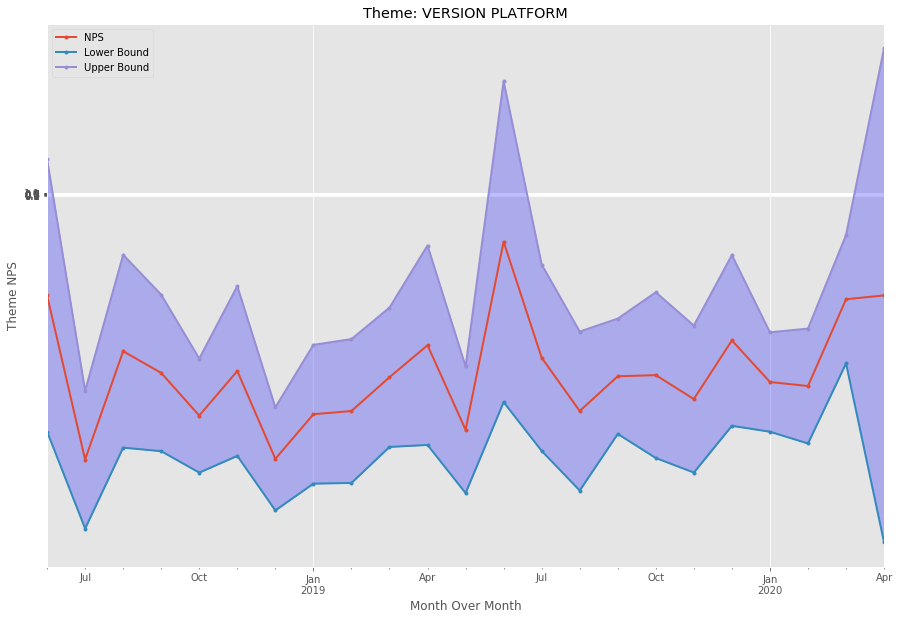

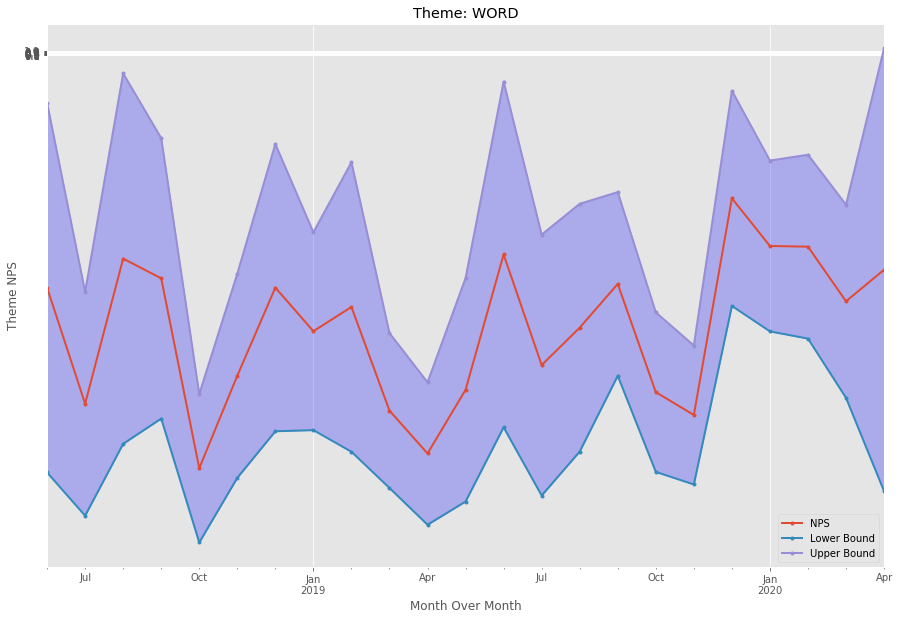

In [155]:
for col in MoM_nps.columns:
    plot_df = pd.DataFrame(index=['NPS','MoE'],data=[MoM_nps[col],monthly_npsmoe[col]]).T#.reset_index()
    plot_df['Lower Bound'] = plot_df['NPS'] - 1.96*plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['NPS'] + 1.96*plot_df['MoE']
    if col == 'admin':
        col += '(ML)'
    ax = plot_df.plot(y=['NPS','Lower Bound','Upper Bound'],grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('Theme NPS')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, color='blue',alpha=0.25)

In [75]:
MoM_all = verbatim_df.groupby(['month_year'])[themes_to_trend.index].sum()
monthly_totals = verbatim_df.month_year.value_counts().sort_index()
MoM_share = MoM_all.copy()
for col in MoM_share:
    MoM_share.loc[:,col] =MoM_share.loc[:,col]/monthly_totals 

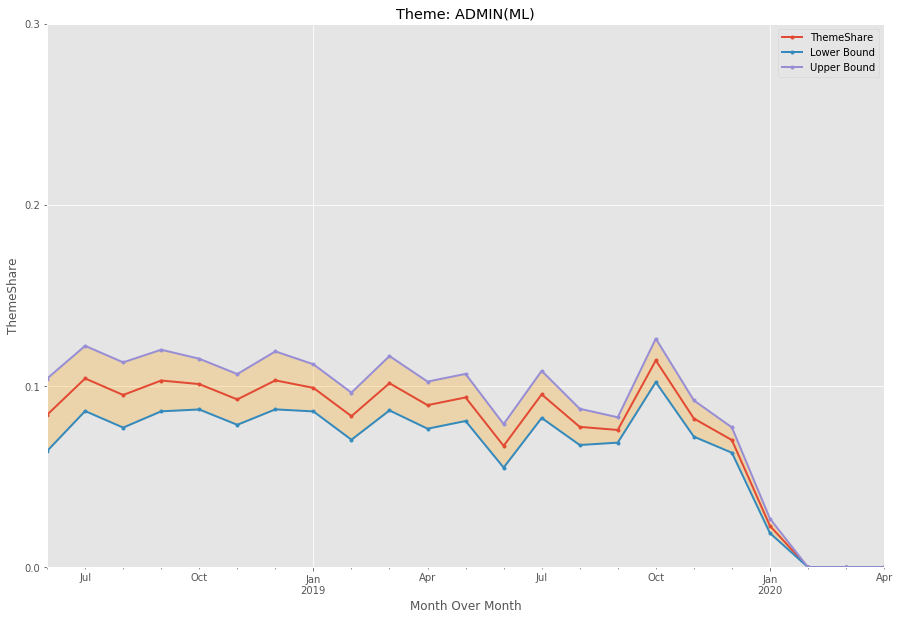

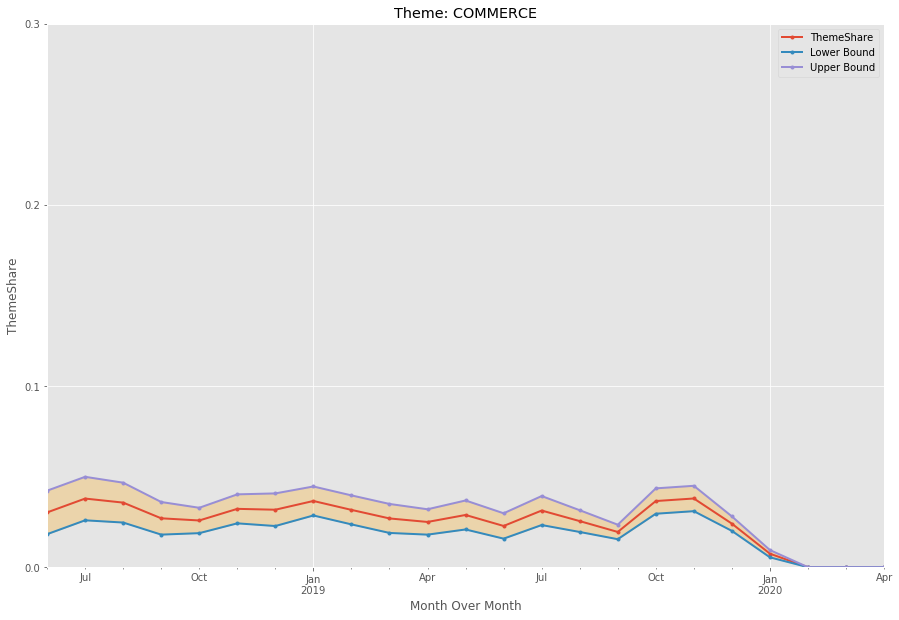

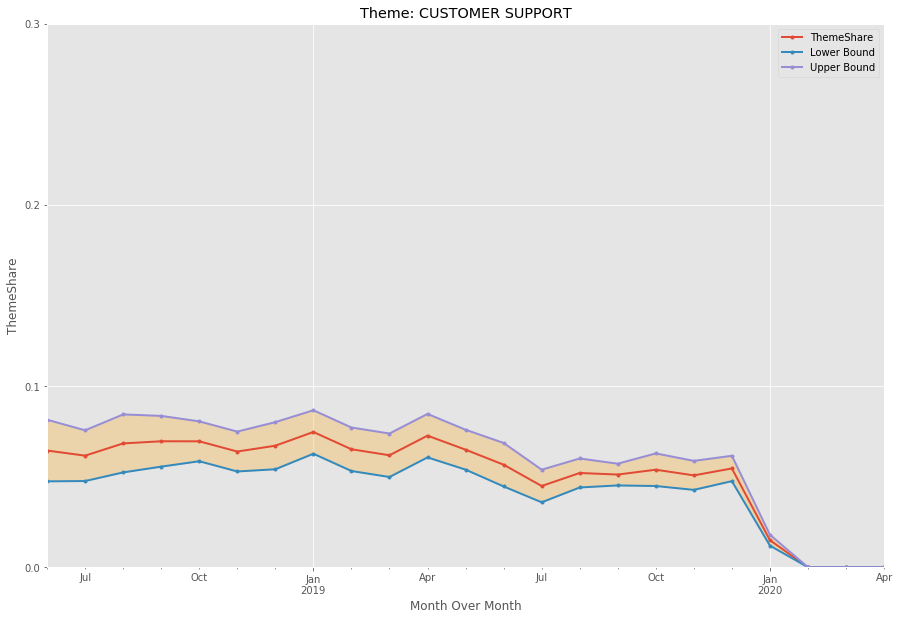

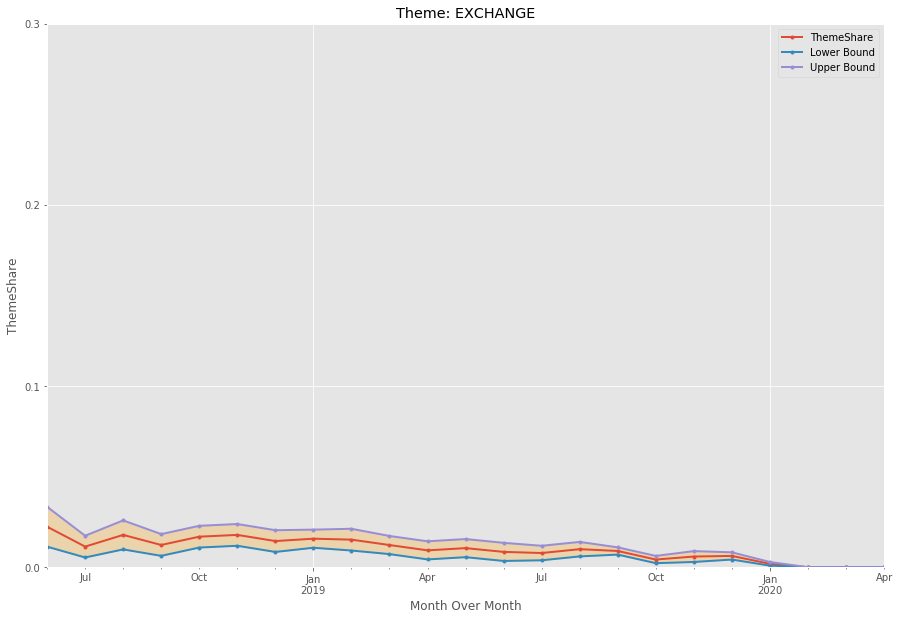

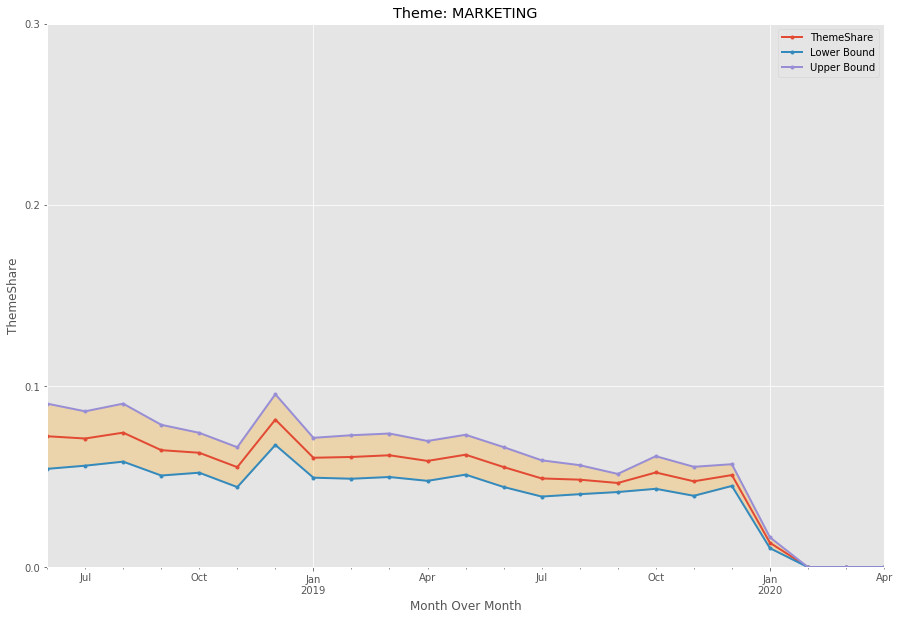

...

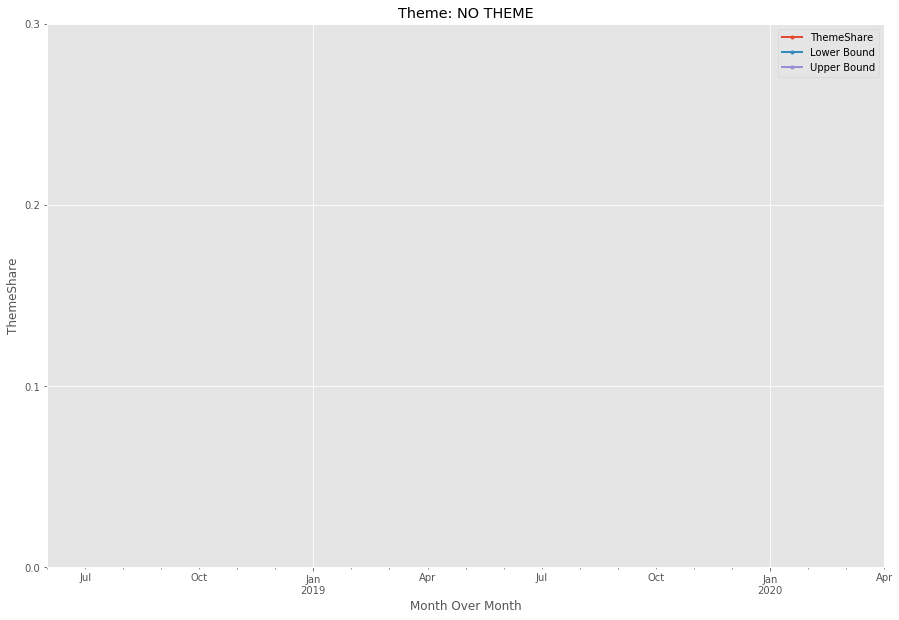

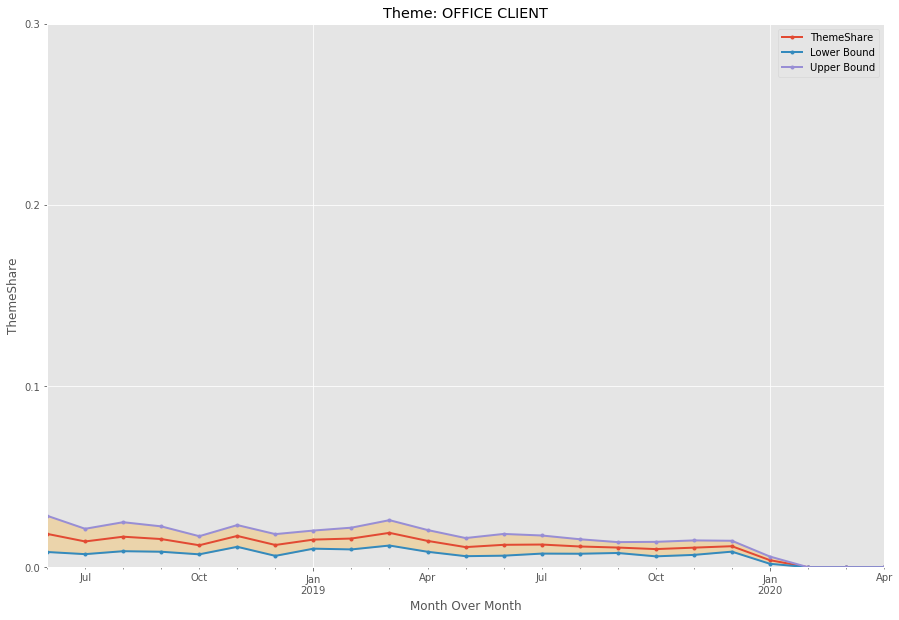

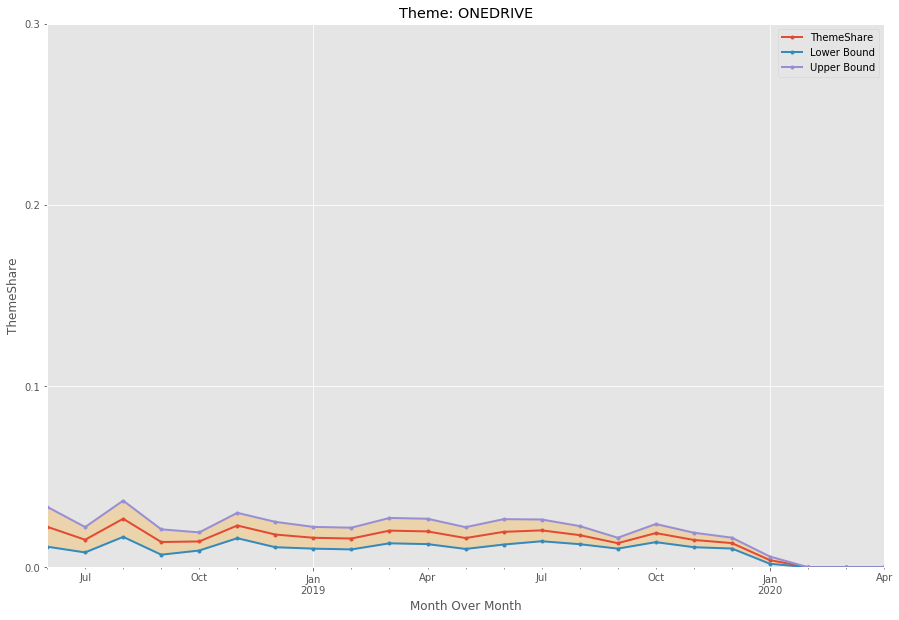

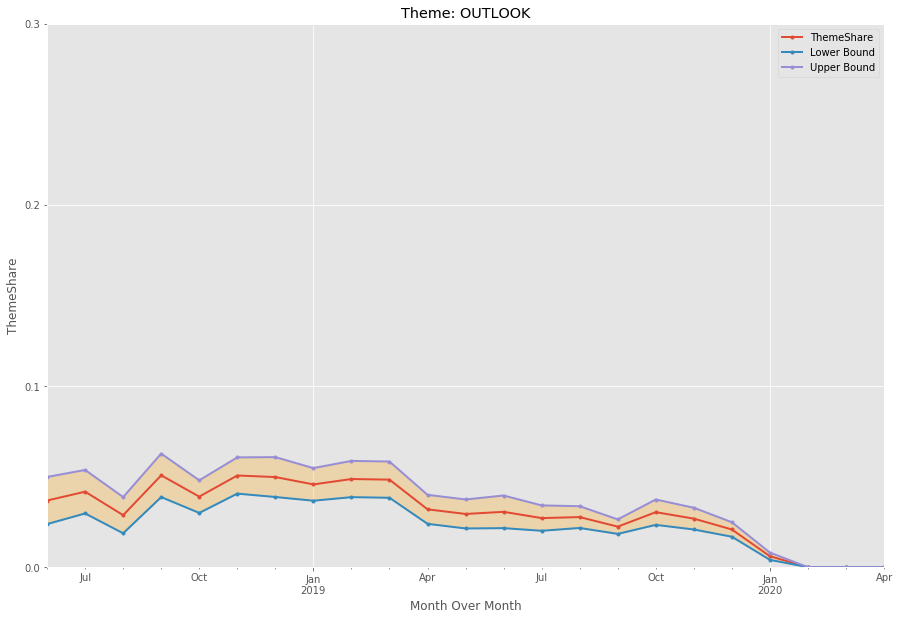

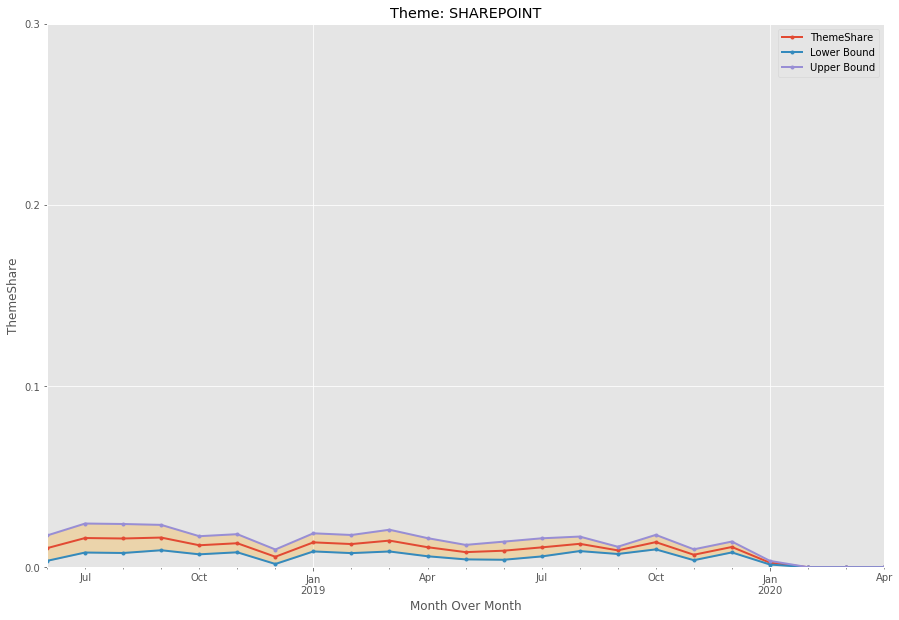

In [76]:
plt.style.use('ggplot')
for col in MoM_share.columns:
    plot_df = pd.DataFrame(index=['ThemeShare','N'],data=[MoM_share[col],monthly_totals]).T#.reset_index()
    plot_df['MoE'] = ((plot_df['ThemeShare']*(1-plot_df['ThemeShare'])/plot_df['N'])**0.5)*1.96
    plot_df['MoE'] = plot_df['MoE'].round(3)
    plot_df['Lower Bound'] = plot_df['ThemeShare'] - plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['ThemeShare'] + plot_df['MoE']
    if col == 'admin':
        col += '(ML)'
    ax = plot_df.plot(y=['ThemeShare','Lower Bound','Upper Bound'],grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),ylim=(0,0.3),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('ThemeShare')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, color='orange',alpha=0.25)

In [77]:
MoM_det = verbatim_df[verbatim_df.Feedback_Rating.isin([1,2,3])].groupby(['month_year'])[themes_to_trend.index].sum()
MoM_BBR = MoM_det.divide(MoM_all).round(3)

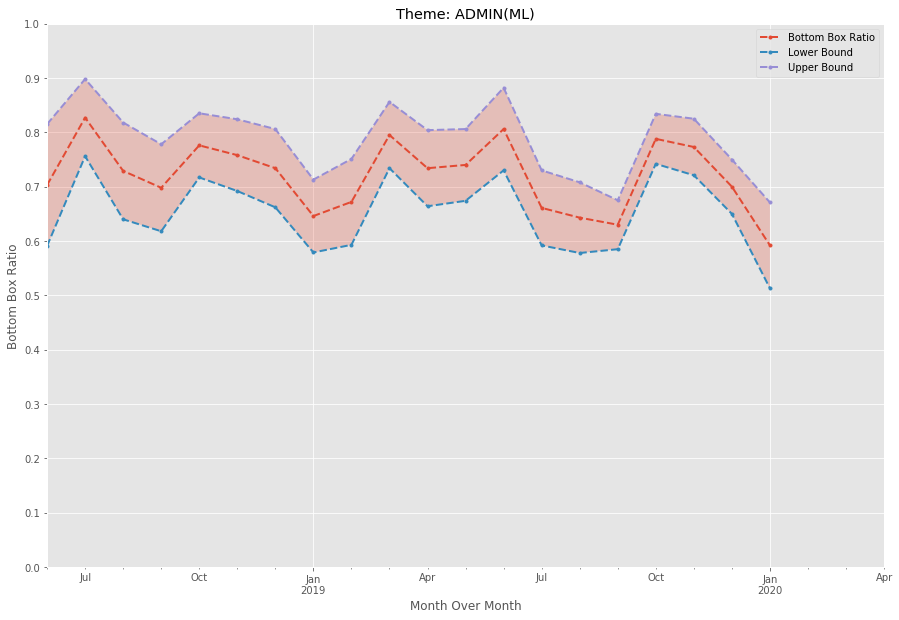

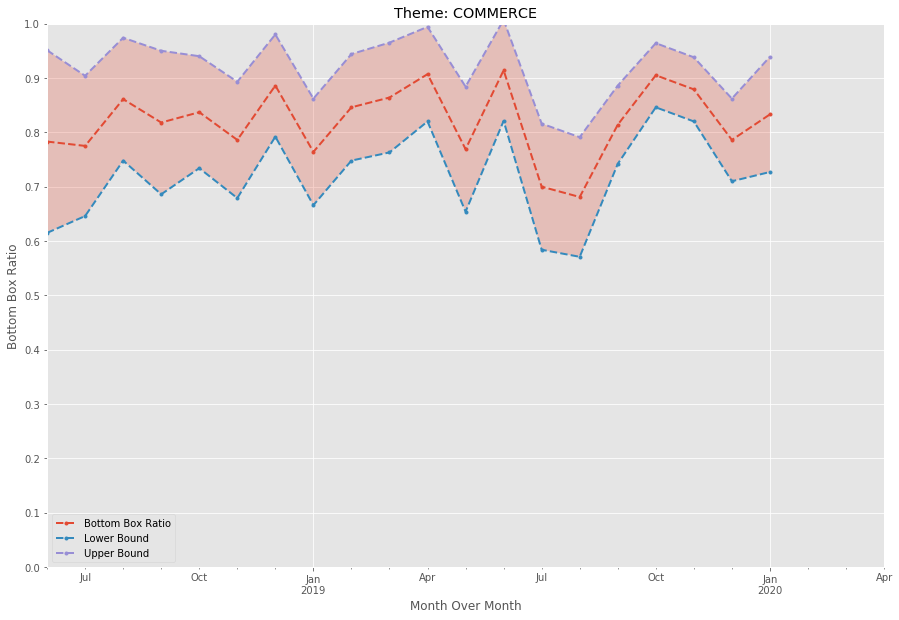

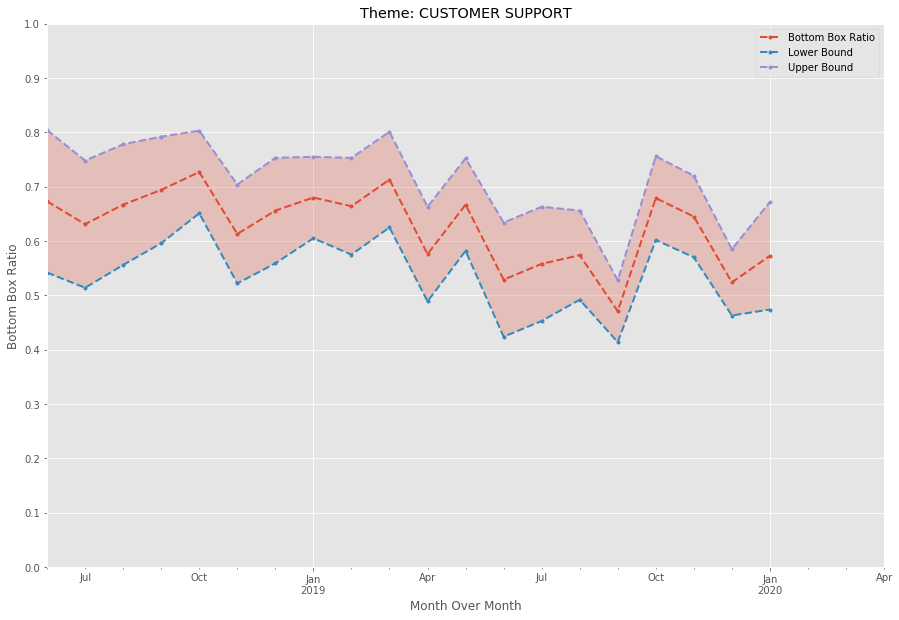

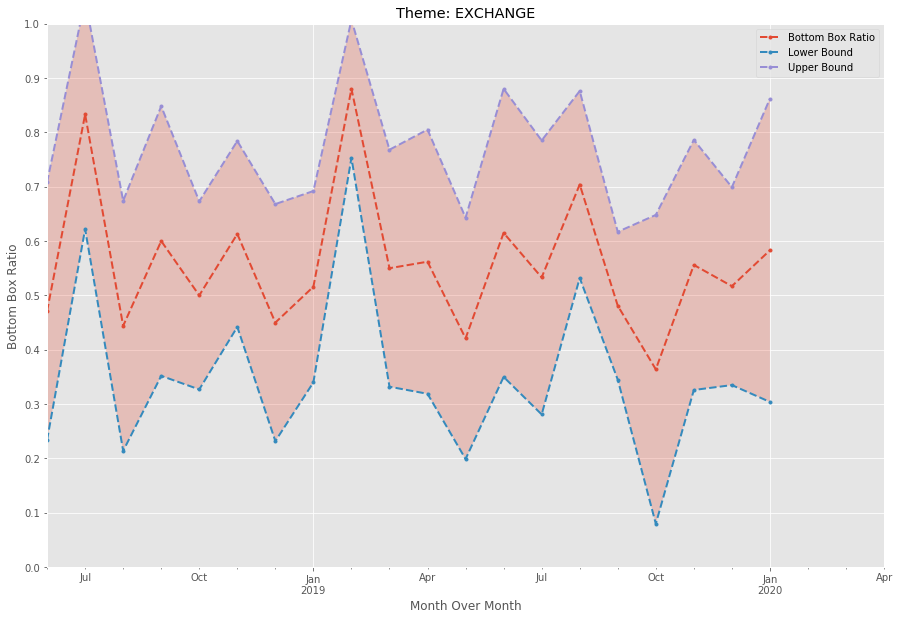

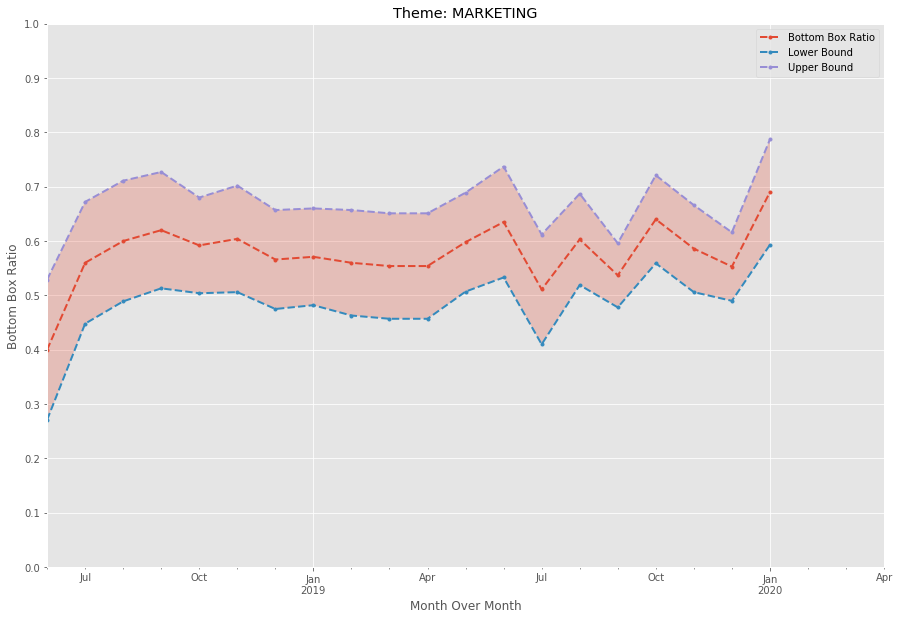

...

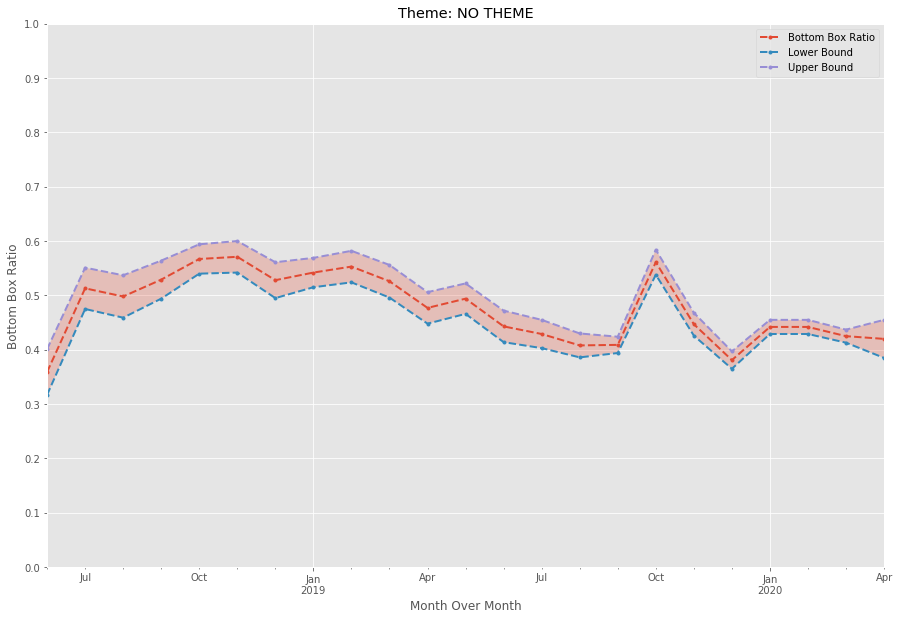

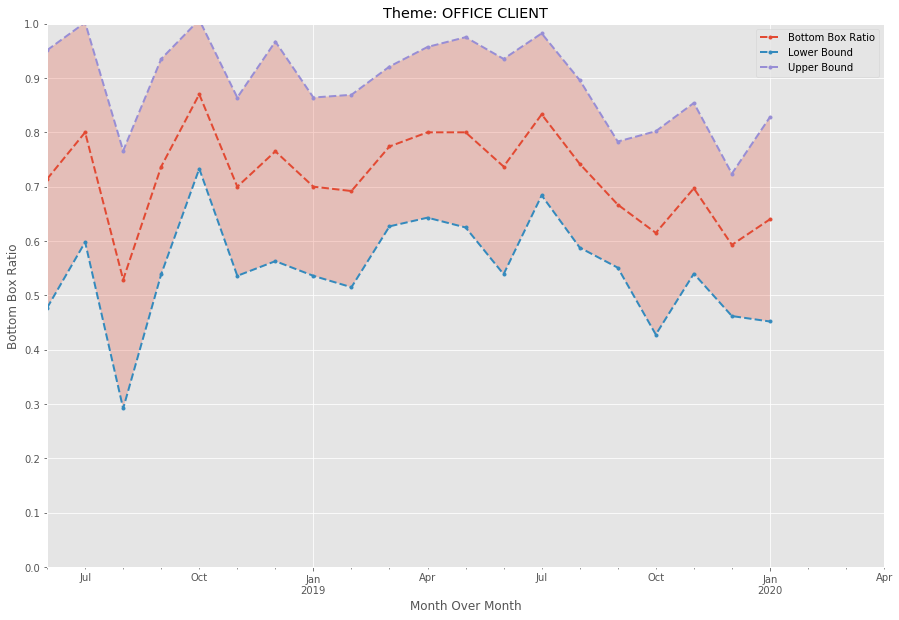

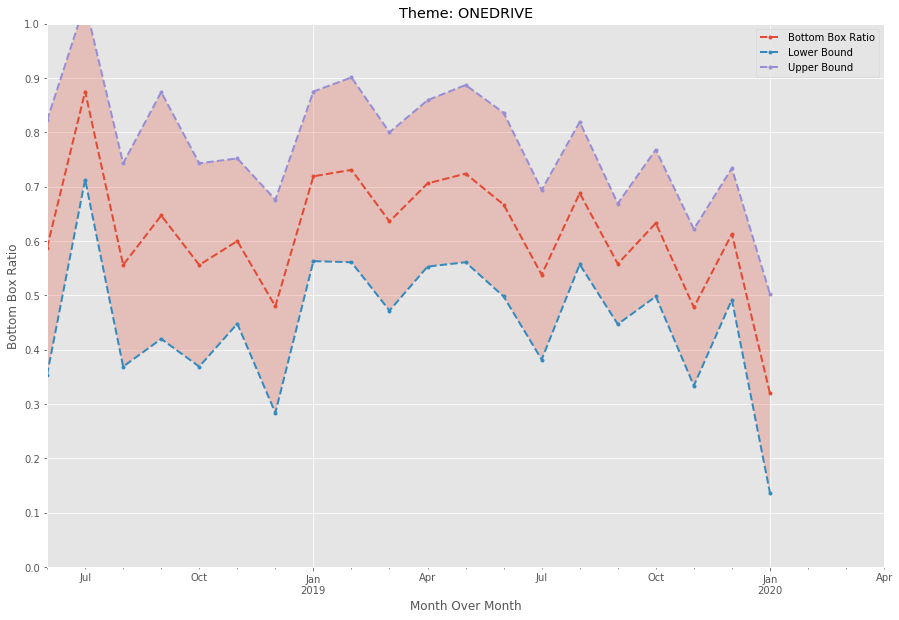

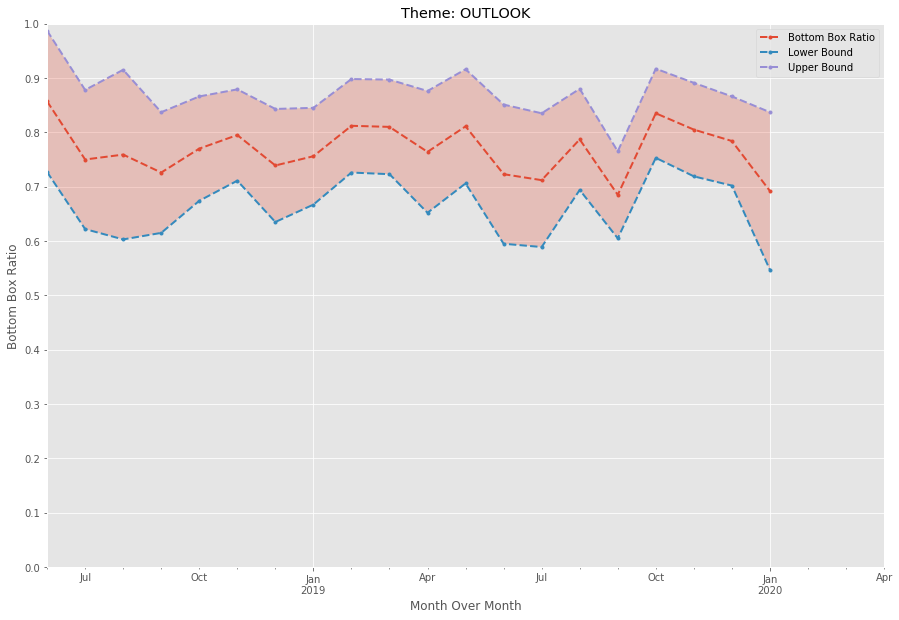

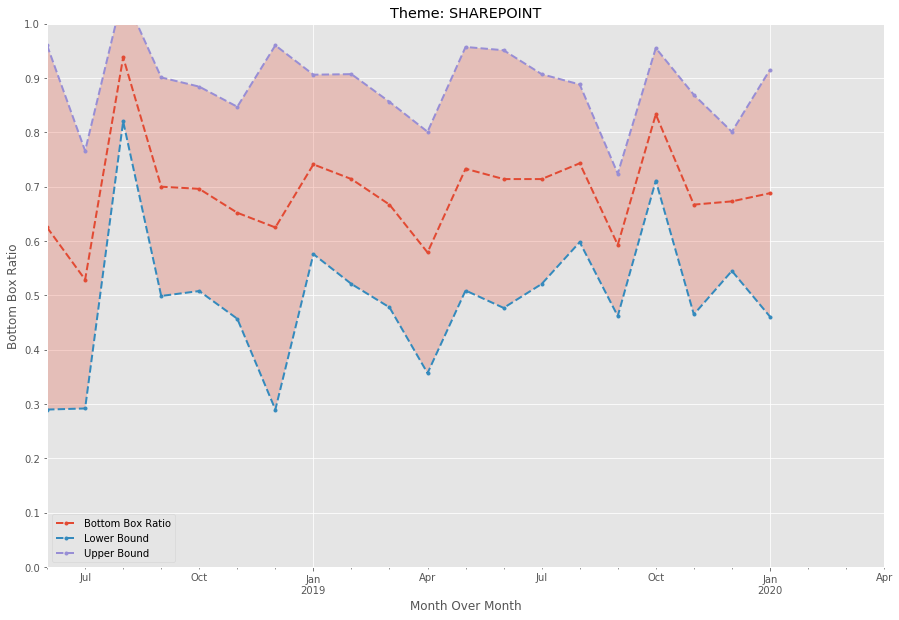

In [78]:
for col in MoM_BBR.columns:
    plot_df = pd.DataFrame(index=['Bottom Box Ratio','N'],data=[MoM_BBR[col],MoM_all[col]]).T#.reset_index()
    plot_df['MoE'] = ((plot_df['Bottom Box Ratio']*(1-plot_df['Bottom Box Ratio'])/plot_df['N'])**0.5)*1.96
    plot_df['MoE'] = plot_df['MoE'].round(3)
    plot_df['Lower Bound'] = plot_df['Bottom Box Ratio'] - plot_df['MoE']
    plot_df['Upper Bound'] = plot_df['Bottom Box Ratio'] + plot_df['MoE']
    if col == 'admin':
        col += '(ML)'
    ax = plot_df.plot(y=['Bottom Box Ratio','Lower Bound','Upper Bound'],style='--',grid=True,figsize=(15,10),
                 yticks=np.linspace(0,1,11),ylim=(0,1),title='Theme: '+col.upper(), marker='.',lw=2)
    ax.set_xlabel('Month Over Month')
    ax.set_ylabel('Bottom Box Ratio')
    ax.fill_between(plot_df.index, plot_df['Lower Bound'], plot_df['Upper Bound'].values, alpha=0.25)

## Uplift

In [79]:
import nps_uplift

In [90]:
def make_uplift_df2(input_df, theme_column='Verbatim_DetailsThemes', rating_column='Feedback_Rating'):
    """
    The input_df argument should contain a documents, ratings, and theme (document categories).
    The input_df should also contain non-verbatim responses from the same time period in order
    to calculate uplift.
    
    The theme_column is expected to have two special values: "no verbatim" and "no theme"; the 
    "no verbatim" value indicates that the feedback did not contain a verbatim, and the "no theme"
    value indicates that there is a verbatim but it did not get classified into a known theme
    category.  The theme_column should have all themes per verbatim in a single row, separated by
    commas.
    """
    
    # clean input_df
    input_df = input_df[(input_df[rating_column] >= 1) & (input_df[rating_column] <= 5)]
    
    # prepare verbatim only df
    input_df.loc[input_df['Feedback_Verbatim'].isnull(),theme_column] = input_df.loc[input_df['Feedback_Verbatim'].isnull(),theme_column].fillna('no verbatim') 
    input_df[theme_column].fillna('no theme',inplace=True)
    verbatim_df = input_df[input_df[theme_column] != 'no verbatim']
    
    # compute non-verbatim variables for formula
    non_verbatim_df = input_df[input_df[theme_column] == 'no verbatim']
    c = non_verbatim_df[non_verbatim_df[rating_column] == 5].shape[0]
    f = non_verbatim_df[non_verbatim_df[rating_column] == 4].shape[0]
    i = non_verbatim_df[non_verbatim_df[rating_column] <= 3].shape[0]
    
    theme_set = set()
    for csv_theme in verbatim_df[theme_column]:
        curr_themes = csv_theme.split(',')
        for theme in curr_themes:
            theme_set.add(theme)
            
    result_df = pd.DataFrame(columns=['Theme', 'Theme Count', 'Base NPS', 'NPS adjusted', 'NPS Max Uplift'])        
            
    result_idx = 0        
    for theme in theme_set:
        #print(theme)
        if theme == 'no theme':
            continue
        
        on_topic_df = verbatim_df[verbatim_df[theme_column].str.contains(theme)] #change to df[df[theme_column] == theme for Greg's stricter version]
        off_topic_df = verbatim_df[~verbatim_df[theme_column].str.contains(theme)] #change accordingly for stricter version
        assert on_topic_df.shape[0] + off_topic_df.shape[0] == verbatim_df.shape[0]
        
        # on-topic variables for formula
        a = on_topic_df[on_topic_df[rating_column] == 5].shape[0] #|(on_topic_df['SentimentProba']>0.75)]?
        d_df = on_topic_df[on_topic_df[rating_column] == 4]#.shape[0]
        g_df = on_topic_df[on_topic_df[rating_column] <= 3]#.shape[0]
        #g_prime = 
                    
        #accounting for positives in Passives
        #current decision: remove
        for V in d_df.Verbatim_Details:
            j = json.loads(V)
            sentences = [s.split(',')[2:5] for s in j]
            relevant_sentences = [l for l in sentences if theme in find_between(l[0],'["','"]')]
            theme_sentiments = [find_between(relevant_sentences[x][1].split(':')[1],
                                             '"','"') for x in range(len(relevant_sentences))]
            before_removal = d_df.shape[0]
            if 'Positive' in theme_sentiments:
                #a = a.append(d[d.Verbatim_Details==V])
                d_df = d_df[d_df.Verbatim_Details!=V]
                assert before_removal > d_df.shape[0]
        
        #accounting for negatives in Promotors
        #current decision: do nothing 
        # for V in a.Verbatim_Details:
        #     j = json.loads(V)
        #     sentences = [s.split(',')[2:5] for s in j]
        #     relevant_sentences = [l for l in sentences if theme in find_between(l[0],'["','"]')]
        #     theme_sentiments = [find_between(relevant_sentences[x][1].split(':')[1],
        #                                      '"','"') for x in range(len(relevant_sentences))]
        #     if 'Negative' in theme_sentiments:
                #d = d.append(a[a.Verbatim_Details==V])
                #a = a[a.Verbatim_Details!=V]
        
        #accounting for positives in Detractors
        #current decision: remove
        #print(g_df.shape[0])
        for V in g_df.Verbatim_Details:
            j = json.loads(V)
            sentences = [s.split(',')[2:5] for s in j]
            relevant_sentences = [l for l in sentences if theme in find_between(l[0],'["','"]')]
            theme_sentiments = [find_between(relevant_sentences[x][1].split(':')[1],
                                             '"','"') for x in range(len(relevant_sentences))]
            before_removal = g_df.shape[0]
            if 'Positive' in theme_sentiments:
                #d = d.append(g[g.Verbatim_Details==V])
                g_df = g_df[g_df.Verbatim_Details!=V]
                assert before_removal > g_df.shape[0]
                
                
        #
        d = d_df.shape[0]
        g = g_df.shape[0]
        
        #assert on_topic_df.shape[0] == a + d + g
        
        # off-topic variables for formula
        b = off_topic_df[off_topic_df[rating_column] == 5].shape[0]
        e = off_topic_df[off_topic_df[rating_column] == 4].shape[0]
        h = off_topic_df[off_topic_df[rating_column] <= 3].shape[0]


        assert off_topic_df.shape[0] == b + e + h

        #print(a,b,c,d,e,f,g,h,i)
        
        movable_detractors = g + (g / (g+h) * i)
        movable_passives = d + (d / (d+e) * f)
        non_movable_detractors = h + (h / (g+h) * i)
        
        numer = a + b + c + movable_detractors + movable_passives - non_movable_detractors
        denom = np.sum([a,b,c,d,e,f,g,h,i])
        nps_adj = numer / denom * 100
        
        base_nps = ((a+b+c) - (g+h+i))/np.sum([a,b,c,d,e,f,g,h,i]) * 100
        
        result_df.loc[result_idx] = pd.Series({'Theme': theme, 'Theme Count':on_topic_df.shape[0], 'Base NPS': base_nps, 'NPS adjusted': nps_adj, 'NPS Max Uplift': nps_adj - base_nps})
        result_idx += 1
                
    return result_df
    

In [81]:
admin_df.shape

(682784, 11)

In [82]:
months_included = sorted(admin_df.month_year.dropna().unique())

In [83]:
months_included

[Period('2018-06', 'M'),
 Period('2018-07', 'M'),
 Period('2018-08', 'M'),
 Period('2018-09', 'M'),
 Period('2018-10', 'M'),
 Period('2018-11', 'M'),
 Period('2018-12', 'M'),
 Period('2019-01', 'M'),
 Period('2019-02', 'M'),
 Period('2019-03', 'M'),
 Period('2019-04', 'M'),
 Period('2019-05', 'M'),
 Period('2019-06', 'M'),
 Period('2019-07', 'M'),
 Period('2019-08', 'M'),
 Period('2019-09', 'M'),
 Period('2019-10', 'M'),
 Period('2019-11', 'M'),
 Period('2019-12', 'M'),
 Period('2020-01', 'M'),
 Period('2020-02', 'M'),
 Period('2020-03', 'M'),
 Period('2020-04', 'M')]

In [84]:
admin_df.loc[admin_df['Feedback_Verbatim'].isnull(),'Verbatim_Themes'] = admin_df.loc[admin_df['Feedback_Verbatim'].isnull(),'Verbatim_Themes'].fillna('no verbatim') 
admin_df.loc[admin_df['Feedback_Verbatim'].isnull(),'Verbatim_Themes']

0         no verbatim
2         no verbatim
3         no verbatim
4         no verbatim
5         no verbatim
             ...     
682778    no verbatim
682779    no verbatim
682780    no verbatim
682781    no verbatim
682783    no verbatim
Name: Verbatim_Themes, Length: 623942, dtype: object

In [85]:
admin_df.loc[admin_df['Feedback_Verbatim'].isnull(),'Verbatim_DetailsThemes'] = admin_df.loc[admin_df['Feedback_Verbatim'].isnull(),'Verbatim_DetailsThemes'].fillna('no verbatim') 

In [86]:
admin_df.Verbatim_Themes.fillna('no theme',inplace=True)
admin_df.Verbatim_DetailsThemes.fillna('no theme',inplace=True)

In [87]:
sum(admin_df.Verbatim_Themes=='no theme'),sum(admin_df.Verbatim_Themes=='no verbatim')

(25484, 623930)

In [88]:
data_dictionary = {}
for month in months_included:
    input_df = admin_df[admin_df['month_year']==month]
    #print(input_df.NgramThemePredictions.value_counts[:3])
    data = make_uplift_df2(input_df,theme_column='Verbatim_Themes',rating_column='Feedback_Rating')
    data['month_year'] = str(month)
    data_dictionary[str(month)] = data

uplift_dfRBC = pd.concat([data_dictionary[str(x)] for x in months_included])

easeofuse-version
22
11 286 5888 6 117 2063 22 319 1112
outlook
70
21 276 5888 10 113 2063 61 271 1112
word
9
2 295 5888 3 120 2063 9 332 1112
skype
18
5 292 5888 5 118 2063 17 323 1112
easeofuse-popup
14
1 296 5888 2 121 2063 14 327 1112
excel
9
2 295 5888 1 122 2063 9 332 1112
powerpoint
7
1 296 5888 1 122 2063 7 334 1112
sharepoint
11
3 294 5888 4 119 2063 10 330 1112
onedrive for business
12
2 295 5888 3 120 2063 12 329 1112
update
12
8 289 5888 7 116 2063 12 329 1112
microsoft groups
3
3 294 5888 0 123 2063 3 338 1112
compete
16
4 293 5888 1 122 2063 16 325 1112
recommend
24
12 285 5888 5 118 2063 24 317 1112
internet explorer
2
0 297 5888 0 123 2063 2 339 1112
bugs
7
0 297 5888 1 122 2063 7 334 1112
access
10
12 285 5888 4 119 2063 10 331 1112
groups
4
3 294 5888 0 123 2063 4 337 1112
version parity
3
0 297 5888 1 122 2063 3 338 1112
change management
19
11 286 5888 6 117 2063 19 322 1112
easeofuse-generalcomplexity
37
10 287 5888 11 112 2063 37 304 1112
performance
40
7 290 5888

In [89]:
sorted(admin_df.month_year.value_counts())

[4807,
 9824,
 17335,
 18894,
 21005,
 21748,
 23434,
 25520,
 25653,
 27628,
 29341,
 29855,
 30015,
 30456,
 33362,
 33665,
 34075,
 36121,
 40904,
 41558,
 44027,
 44491,
 59066]

In [91]:
import json
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

def find_between( s, first, last ):
    try:
        start = s.index( first ) + len( first )
        end = s.index( last, start )
        return s[start:end]
    except ValueError:
        return ""

In [92]:
data_dictionary = {}
for month in months_included:
    input_df = admin_df[admin_df['month_year']==month]
    #print(input_df.shape)
    data = make_uplift_df2(input_df,theme_column='Verbatim_DetailsThemes',rating_column='Feedback_Rating')
    data['month_year'] = str(month)
    data_dictionary[str(month)] = data

uplift_dfML = pd.concat([data_dictionary[str(x)] for x in months_included])

(9824, 11)
(18894, 11)
(17335, 11)
(21005, 11)
(33362, 11)
(30456, 11)
(25653, 11)
(36121, 11)
(29855, 11)
(29341, 11)
(27628, 11)
(30015, 11)
(21748, 11)
(23434, 11)
(25520, 11)
(44027, 11)
(59066, 11)
(40904, 11)
(33665, 11)
(44491, 11)
(34075, 11)
(41558, 11)
(4807, 11)


In [93]:
uplift_dfML.month_year.unique()

array(['2018-06', '2018-07', '2018-08', '2018-09', '2018-10', '2018-11',
       '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05',
       '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11',
       '2019-12', '2020-01'], dtype=object)

In [94]:
ml_to_trend = ['admin','commerce','customer support','outlook']
rbc_to_trend = ['ease_of_use','easeofuse-generalcomplexity','easeofuse-navigation','easeofuse-popup',
                'easeofuse-howto','easeofuse-version','subscription value']

In [95]:
uplift_dfML[uplift_dfML.Theme=='admin']

,Theme,Theme Count,Base NPS,NPS adjusted,NPS Max Uplift,month_year
11,admin,64,48.515155,52.106178,3.591024,2018-06
10,admin,110,48.244404,52.291214,4.046810,2018-07
10,admin,96,48.040462,51.267102,3.226640,2018-08
10,admin,126,46.885293,50.314660,3.429367,2018-09
10,admin,192,47.133586,50.314803,3.181217,2018-10
10,admin,161,46.917639,50.867661,3.950021,2018-11
11,admin,143,48.675742,54.120263,5.444521,2018-12
11,admin,195,48.544281,53.496007,4.951726,2019-01
10,admin,137,47.290822,51.235890,3.945068,2019-02
10,admin,166,47.599564,52.529352,4.929788,2019-03


In [96]:
uplift_dfML[uplift_dfML.Theme=='admin'].set_index('month_year').to_csv('monthlyUplift2020ML.csv')
uplift_dfML[uplift_dfML.Theme=='commerce'].set_index('month_year').to_csv('monthlyUplift2020ML.csv',mode='a')
uplift_dfML[uplift_dfML.Theme=='customer support'].set_index('month_year').to_csv('monthlyUplift2020ML.csv',mode='a')
uplift_dfML[uplift_dfML.Theme=='outlook'].set_index('month_year').to_csv('monthlyUplift2020ML.csv',mode='a')
#uplift_dfML[uplift_dfML.Theme=='marketing'].set_index('month_year').to_csv('monthlyUplift2020ML.csv',mode='a')

In [97]:
uplift_dfRBC[uplift_dfRBC.Theme=='easeofuse-howto'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv')
uplift_dfRBC[uplift_dfRBC.Theme=='easeofuse-generalcomplexity'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
uplift_dfRBC[uplift_dfRBC.Theme=='easeofuse-version'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
uplift_dfRBC[uplift_dfRBC.Theme=='easeofuse-popup'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
uplift_dfRBC[uplift_dfRBC.Theme=='easeofuse-navigation'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
#uplift_dfRBC[uplift_dfRBC.Theme=='support'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
#uplift_dfRBC[uplift_dfRBC.Theme=='outlook'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')
uplift_dfRBC[uplift_dfRBC.Theme=='subscription value'].set_index('month_year').to_csv('monthlyUplift2020RBC.csv',mode='a')


In [98]:
MLuplift_monthly = uplift_dfML[uplift_dfML.Theme.isin(ml_to_trend)].pivot(index='month_year',
                                                                          columns='Theme',values='NPS Max Uplift')

In [99]:
RBCuplift_monthly = uplift_dfRBC[uplift_dfRBC.Theme.isin(rbc_to_trend)].pivot(index='month_year',
                                                                              columns='Theme',
                                                                              values='NPS Max Uplift')#,
                                                                                     #'Theme Count'])

In [100]:
RBCuplift_monthly

Theme,ease_of_use,easeofuse-generalcomplexity,easeofuse-howto,easeofuse-navigation,easeofuse-popup,easeofuse-version,subscription value
month_year,,,,,,,
2018-06,14.520800,5.199610,3.427606,1.504350,1.576269,2.993872,6.356974
2018-07,14.725868,5.819182,3.137218,0.497134,2.030417,3.398891,7.789489
2018-08,13.011791,4.640167,2.986687,0.799054,1.542735,3.095258,6.775690
2018-09,14.033884,5.333814,3.148395,0.707418,2.562641,2.494812,6.039089
2018-10,14.836540,4.573529,3.545606,1.156106,2.008530,3.289804,6.782062
2018-11,14.496794,4.777171,3.509689,1.473114,2.464684,2.706788,6.327108
2018-12,14.162806,5.077376,3.284166,1.109962,2.217384,2.845515,6.837059
2019-01,12.972426,5.262322,2.674093,0.713687,1.874543,2.659952,5.686423
2019-02,15.520367,5.141368,3.282604,1.138125,2.696813,3.779310,5.862007


In [101]:
RBCuplift_monthly.round(1)

Theme,ease_of_use,easeofuse-generalcomplexity,easeofuse-howto,easeofuse-navigation,easeofuse-popup,easeofuse-version,subscription value
month_year,,,,,,,
2018-06,14.5,5.2,3.4,1.5,1.6,3.0,6.4
2018-07,14.7,5.8,3.1,0.5,2.0,3.4,7.8
2018-08,13.0,4.6,3.0,0.8,1.5,3.1,6.8
2018-09,14.0,5.3,3.1,0.7,2.6,2.5,6.0
2018-10,14.8,4.6,3.5,1.2,2.0,3.3,6.8
2018-11,14.5,4.8,3.5,1.5,2.5,2.7,6.3
2018-12,14.2,5.1,3.3,1.1,2.2,2.8,6.8
2019-01,13.0,5.3,2.7,0.7,1.9,2.7,5.7
2019-02,15.5,5.1,3.3,1.1,2.7,3.8,5.9


In [102]:
MLuplift_monthly

Theme,admin,commerce,customer support,outlook
month_year,,,,
2018-06,3.591024,1.152764,1.801666,1.510487
2018-07,4.046810,0.786520,1.274947,1.259029
2018-08,3.226640,0.709512,2.029334,1.242365
2018-09,3.429367,0.762279,1.814934,1.975389
2018-10,3.181217,0.693677,2.176843,1.328782
2018-11,3.950021,1.107791,2.300816,2.050700
2018-12,5.444521,1.484886,2.650631,2.544634
2019-01,4.951726,2.020856,3.274464,2.380915
2019-02,3.945068,1.820179,3.069250,2.782682


In [182]:
MLuplift_monthly.to_csv('MonthlyMLUplift.csv')

In [364]:
MLuplift_monthly.join(RBCuplift_monthly,lsuffix='ML',rsuffix='RBC').to_csv('monthlyUpliftAll.csv')

### Marginal Uplift Plot and Admin+EOU's

In [405]:
admin_EOU_df = df[df['NgramThemePredictions'].str.contains('easeofuse')&df['ML_Theme'].str.contains('admin')] 

eou_list_col = ['ease_of_use','easeofuse-popup','easeofuse-howto','easeofuse-version',
            'easeofuse-generalcomplexity','easeofuse-navigation']

topics = eou_list_col

In [406]:
for i, item in enumerate(topics):
    admin_EOU_df[item] = admin_EOU_df['NgramThemePredictions'].str.contains(item)*1


topic_df = admin_EOU_df.loc[:,topics].dropna().transpose()
topic_df['ThemeTotal'] = topic_df.sum(axis=1)
verbatim_total = verbatim_df.shape[0]
topic_df['ThemeShare'] = topic_df['ThemeTotal'].divide(verbatim_total).round(3)


C:\Users\v-Jaand\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [407]:
bbr_dict = {}
for t in topics:
    #print(t)
    theme_df = verbatim_df[verbatim_df[t]==1]
    #print(theme_df.Feedback_Rating.value_counts())
    if len(theme_df) != 0:
        bbr = len(theme_df[theme_df.Feedback_Rating.isin([1,2,3])])/len(theme_df)
    else:
        bbr = 0
    bbr_dict[t] = round(bbr,3)

bbr_df = pd.DataFrame(index = bbr_dict.keys(),columns=['BBR'],data = bbr_dict.values())
bbr_df

final_df = pd.concat([topic_df,bbr_df],axis=1).iloc[:,-3:]

final_df

,ThemeTotal,ThemeShare,BBR
ease_of_use,1429,0.027,0.749
easeofuse-popup,217,0.004,0.919
easeofuse-howto,424,0.008,0.831
easeofuse-version,271,0.005,0.636
easeofuse-generalcomplexity,657,0.013,0.695
easeofuse-navigation,159,0.003,0.793


In [409]:
admin_EOU_df['easeofuse-howto']

Feedback_ID
fe831e69-f8c9-47a7-820c-6d0dee53f99d    1
e0a18d96-9281-4035-89df-3cf500d0d64a    1
09a354e2-4f5d-4f3f-8a05-155735e04f07    0
51223e9a-cd2b-46b8-8894-e566b65b0556    0
93101b78-8deb-470d-9db4-4d58363e690d    0
                                       ..
8cf1edea-7e2e-4b19-ac3c-b7de635f7030    0
a15f6ec3-d54a-4604-981c-901cb105dba3    0
ac45b55e-af77-4cb3-bd7c-6a1ad0dd4ca4    0
23c53fc3-9288-492a-8f67-4952975a199c    0
ddcc7dd2-3a75-409a-86e5-c8573315a9db    0
Name: easeofuse-howto, Length: 1451, dtype: int32

In [392]:
'easeofuse-howto'.split('-')[1].upper()

'HOWTO'

In [414]:
admin_howto = df.join(admin_EOU_df['easeofuse-howto'].astype(str).to_frame(),lsuffix='+admin')

In [415]:
admin_howto.loc[admin_howto['Feedback_Verbatim'].isnull(),'easeofuse-howto+admin'] =\
admin_howto.loc[df['Feedback_Verbatim'].isnull(),'easeofuse-howto+admin'].fillna('no verbatim') 


In [412]:
admin_EOU_df['easeofuse-howto'].astype(str).replace('1',eou.split('-')[1].upper())

Feedback_ID
fe831e69-f8c9-47a7-820c-6d0dee53f99d    NAVIGATION
e0a18d96-9281-4035-89df-3cf500d0d64a    NAVIGATION
09a354e2-4f5d-4f3f-8a05-155735e04f07             0
51223e9a-cd2b-46b8-8894-e566b65b0556             0
93101b78-8deb-470d-9db4-4d58363e690d             0
                                           ...    
8cf1edea-7e2e-4b19-ac3c-b7de635f7030             0
a15f6ec3-d54a-4604-981c-901cb105dba3             0
ac45b55e-af77-4cb3-bd7c-6a1ad0dd4ca4             0
23c53fc3-9288-492a-8f67-4952975a199c             0
ddcc7dd2-3a75-409a-86e5-c8573315a9db             0
Name: easeofuse-howto, Length: 1451, dtype: object

In [376]:
for eou in eou_list_col:
    if eou+'+admin' in df.columns:
        df.drop(columns=eou,inplace=True)
    df = df.join(admin_EOU_df[eou].astype(str)).to_frame(),lsuffix='+admin')
    eou = eou+'+admin'
    df.loc[df['Feedback_Verbatim'].isnull(),eou] = df.loc[df['Feedback_Verbatim'].isnull(),'eou'].replace('nan','no verbatim')
    df[eou] = df[eou].astype(str).str.replace('nan','no theme')
    df.loc[df['Feedback_Verbatim'].notnull(),eou] = df.loc[df['Feedback_Verbatim'].notnull(),eou].replace('no verbatim','other')
    df[eou] = df[eou].astype(str).str.replace('1',eou.split('-')[1].upper())
    df[eou] = df[eou].astype(str).str.replace('0','other')

In [377]:
eou.split('-')[1].upper()

'NAVIGATION'

In [378]:
# df = df[df['month_year']!='2018-06']
# df = df[df['month_year']!='2018-07']
months_included.remove(pd.Period('2020-03', 'M'))

ValueError: list.remove(x): x not in list

In [379]:
eou_dictionary = {}
for eou in eou_list_col:
    print(eou)
    months_included = sorted(df.month_year.unique().dropna())
    months_included.remove(pd.Period('2020-03', 'M'))
    data_dictionary = {}
    for month in months_included:
        input_df = df[df['month_year']==month]
        print(month, input_df.shape)
        data = nps_uplift.make_uplift_df(input_df,theme_column=eou,rating_column='Feedback_Rating')
        data = data[data.Theme!='other']
        data['month_year'] = str(month)
        data_dictionary[str(month)] = data
        eou_dictionary[eou] = data_dictionary



easeofuse-popup
2018-06 (9824, 17)
2018-07 (18894, 17)
2018-08 (17335, 17)
2018-09 (21005, 17)
2018-10 (33362, 17)
2018-11 (30456, 17)
2018-12 (25653, 17)
2019-01 (36121, 17)
2019-02 (29855, 17)
2019-03 (29341, 17)
2019-04 (27628, 17)
2019-05 (30015, 17)
2019-06 (21748, 17)
2019-07 (23434, 17)
2019-08 (25520, 17)
2019-09 (44027, 17)
2019-10 (59066, 17)
2019-11 (40904, 17)
2019-12 (33665, 17)
2020-01 (44491, 17)
2020-02 (34075, 17)
easeofuse-howto
2018-06 (9824, 17)
2018-07 (18894, 17)
2018-08 (17335, 17)
2018-09 (21005, 17)
2018-10 (33362, 17)
2018-11 (30456, 17)
2018-12 (25653, 17)
2019-01 (36121, 17)
2019-02 (29855, 17)
2019-03 (29341, 17)
2019-04 (27628, 17)
2019-05 (30015, 17)
2019-06 (21748, 17)
2019-07 (23434, 17)
2019-08 (25520, 17)
2019-09 (44027, 17)
2019-10 (59066, 17)
2019-11 (40904, 17)
2019-12 (33665, 17)
2020-01 (44491, 17)
2020-02 (34075, 17)
easeofuse-version
2018-06 (9824, 17)
2018-07 (18894, 17)
2018-08 (17335, 17)
2018-09 (21005, 17)
2018-10 (33362, 17)
2018-11 (3045

In [380]:
admin_popup = pd.concat([eou_dictionary['easeofuse-popup'][str(x)] for x in months_included])
admin_howto = pd.concat([eou_dictionary['easeofuse-howto'][str(x)] for x in months_included])
admin_gencomplex = pd.concat([eou_dictionary['easeofuse-generalcomplexity'][str(x)] for x in months_included])
admin_version = pd.concat([eou_dictionary['easeofuse-version'][str(x)] for x in months_included])
admin_navigation = pd.concat([eou_dictionary['easeofuse-navigation'][str(x)] for x in months_included])

In [381]:
admin_eou_uplift_df = pd.concat([admin_popup,admin_howto,admin_version,
                                admin_navigation,admin_gencomplex])

In [382]:
admin_eou_uplift_monthly = admin_eou_uplift_df.pivot(index='Theme',
                                             columns='month_year',values=['NPS Max Uplift','Theme Count'])

In [383]:
admin_eou_uplift_monthly.stack().to_csv('AdminEOUComboUplifts.csv')